Next time, try to casefold into lower cases first (all suburb/SA2 names)

# <a href=#summary_lookup_rental>Skip to this section if want for a summary of preprocessing steps for lookup and historical rental data </a>

# Table of Contents <a name='ToC' />
<a href=#bookmark0>0. Import the data</a>

<a href=#bookmark1>1. An idea: in unemployment data, for SA2s comprised of > 1 suburbs, collapse them into individual suburbs </a>

<a href=#bookmark1.1>1.1 Collapse such SA2s to individual suburbs in unemployment data</a>

<a href=#bookmark1.2>1.2. Merge the instances with such SA2s, that's collapsed into their individual suburbs, into the original data</a>

<a href=#bookmark1.3>1.3 Deal with SA2s that have '-' but is actually one suburb/part of a suburb</a>


<a href=#bookmark2>2. Do the same thing (split up SA2s comprised of multiple suburbs into individual suburb) for the historical rental data</a>

<a href=#bookmark2.1>2.1 Collapse such SA2s to individual suburbs in historical rental data</a>

<a href=#bookmark2.2>2.2 Deal with SA2s that have '-' but is actually one suburb/part of a suburb</a>

<a href=#bookmark3>3. For unemployment data, Retain suburbs that are actually suburbs (no more, no less of a suburbian granularity!)</a>


<a href=#bookmark3.1>3.1 Import lookup data for victorian suburbs; will be used as reference as to which is a suburb and which is not</a>

<a href=#bookmark3.1.2>3.1.2 With a little bit of research, among the suburbs of the form <code>SUBURB (REGION - Vic.)</code>, apparently the regions (<code>REGION</code>) located inside <code>(REGION - Vic.)</code> are mostly local government areas. I claim that suburbs that have non-alphabetic characters are ONLY the ones that of the format <code>SUBURB (REGION - Vic.)</code>. This assumption will be checked later.
</a>

<a href=#bookmark3.1.2.1>3.1.2.1 Check the assumption that the suburbs containing non-alphabetic chars in the victorian suburbs lookup data are only those of the form <code>SUBURB (REGION - Vic.)</code>
</a>

<a href=#bookmark3.1.2.2>3.1.2.2 I was wrong, there's one suburb "Murray-sunset" that refutes this assumption. But it turns out Murray-sunset is a national park, not a suburb. We can remove it from the victoria suburbs lookup</a>

<a href=#bookmark3.1.3>3.1.3 Only retain <code>SUBURB</code> in suburbs of the form <code>SUBURB (REGION - Vic.)</code></a>

<a href=#bookmark3.2>3.2 Back to unemployment data: Make sure that those suburbs without '-' are actually suburbs. Start by finding suburbs/regions that are not in suburb lookup data</a>

<a href=#bookmark3.2.1>3.2.1 Remove non alphabetic suffixes e.g. <code>(Vic.)</code>  in some suburbs in unemployment data</a>

<a href=#bookmark3.2.2>3.2.2 Reattempt finding suburbs that are not in the suburb lookup data</a>

<a href=#bookmark3.2.3>3.2.3 I might stop here, do it later after joining unemployment data with rental data!</a>

<a href=#bookmark3.3>3.3 For Unemployment data, Remove redundant "partial" suburbs with '-' (i.e. for SA2s that only encopass *part* of a suburb, check if their parent suburbs exist on the unemployment data)!</a>

<a href=#bookmark3.4>3.4  Remove *all* such SA2s encompassing 'partial' suburbs, with justification provided</a>

<a href=#bookmark4>4. Collapse the date columns in unemployment data</a>

<a href=#bookmark5>5. Only retain all observations in the fourth quarter for BOTH unemployment and rental data</a>

<a href=#bookmark5.1>5.1 Retain observations in 4th quarter for unemployment data</a>

<a href=#bookmark5.2>5.2 Retain observations in 4th quarter for rental data</a>

<a href=#bookmark6>6. Carefully join both datasets based on ['Year', 'Suburb']</a>

<a href=#bookmark6.1>6.1 For each data, investigate all suburbs that are NOT in the suburb lookup data. Then do a fuzzy join to attempt to "fix" those suburbs, should there be naming or spelling inconsistencies</a>

<a href=#bookmark6.1.1>6.1.1 For the rental data</a>

<a href=#bookmark6.1.1.1>6.1.1.1 Remove obvious non-suburbs for rental data</a>

<a href=#bookmark6.1.1.2>6.1.1.2 After fuzzy join, Rename suburbs for rental data</a>

<a href=#bookmark6.1.2>6.1.2 For the unemployment data</a>

<a href=#bookmark6.1.2.1>6.1.2.1 Drop some "suburbs" that are not actually suburbs in the unemployment data</a>

<a href=#bookmark6.1.2.2>6.1.2.2 Fix ambiguous suburbs</a>

<a href=#bookmark6.2>6.2 Attempt to join both datasets!</a>

<a href=#bookmark6.2.1>6.2.1 Lowercase all suburbs so that we won't have any misses during the joining</a>

<a href=#bookmark6.2.2>6.2.2 Typecast the year for both datasets into ints</a>

<a href=#bookmark6.2.3>6.2.3 Join both datasets!</a>




# Import the data and libraries <a name='bookmark0' />
- Scraped rental data from domain
- Historical (median) rental data (because unemployment data is a time series with only ONE attribute)
- unemployment data

In [1]:
import geopandas as gpd
import pandas as pd
import ast #can make use of ast.literal_eval(string_rep_of_list) to convert string repr of list to actual list object
from shapely.geometry import Point
import folium
import numpy as np
import matplotlib.pyplot as plt
from shapely import wkt #to find centroid of a polygon
import difflib
import seaborn as sns
from pandas.plotting import parallel_coordinates

In [2]:
unemp_data = pd.read_csv('../data/curated/Preproc_Unemployment_Data.csv').drop(columns=['Unnamed: 0'])
historical_rental_data = pd.read_csv('../data/curated/Weekly_Median_Suburb_Rents.csv').drop(columns=['Unnamed: 0'])
scraped_rental_data = pd.read_csv('../data/curated/Final_Preprocessed_Scraped_Rental.csv').drop(columns=['Unnamed: 0'])

# 1. An idea: in unemployment data, for SA2s comprised of > 1 suburbs, collapse them into individual suburbs <a name='bookmark1' />
- In particular, assume that unemployment rate or median rental rate within EACH suburb in such SA2s are UNIFORM

<a href=#ToC>Back to Table of Content</a>

# 1.1 Collapse such SA2s to individual suburbs in unemployment data <a name='bookmark1.1' />

Idea:

- Usually SA2s that contain > 1 suburb are separated by '-' dashes
    - BUT, SA2s containing '-' but also containing directions e.g. <code>Moyne - East</code> are actually individual suburbs 
    - So extract instances where SA2 names contain '-' BUT with no directions e.g. North, East, etc 
    
- For each instance with such SA2s we duplicate them, except the <code>SA2_Name</code> is the individual suburbs, depending on how many suburbs its contained.

Note: SA2s containing '-' but also containing directions e.g. <code>Moyne - East</code> are actually individual suburbs 

In [3]:
#Note: $ is a metacharacter in regex, stating the end
SA2s_unemp_data_w_multiple_suburbs = unemp_data['SA2_Name'][
    (unemp_data['SA2_Name'].str.contains('-')) & 
    ~(unemp_data['SA2_Name'].str.contains('- North$')) &
    ~(unemp_data['SA2_Name'].str.contains('- South$')) &
    ~(unemp_data['SA2_Name'].str.contains('- East$')) &
    ~(unemp_data['SA2_Name'].str.contains('- West$')) 
]

#split the suburbs in each SA2 to individual suburbs 
SA2s_unemp_data_w_multiple_suburbs = SA2s_unemp_data_w_multiple_suburbs.str.split(r'\s*-\s*')



In [4]:
#create empty dataframe with empty columns, for storing instances where SA2s 
#comprised of multiple suburbs
unemp_data_SA2s_w_multiple_suburbs = pd.DataFrame(columns=unemp_data.columns)

#extract the indexes
SA2s_unemp_data_w_multiple_suburbs_index = SA2s_unemp_data_w_multiple_suburbs.index

#iterator variable for obtaining indexes of instances for which SA2s are 
#located in SA2s_unemp_data_w_multiple_suburbs
i = 0 

for multiple_suburbs_in_a_SA2 in SA2s_unemp_data_w_multiple_suburbs:
    
    #extract the corresponding index, so that we can modify the instance later
    idx = SA2s_unemp_data_w_multiple_suburbs_index[i]
    
    
    #for each individual suburb in the SA2
    for individual_suburb in multiple_suburbs_in_a_SA2:
        
        #extract instance where its SA2 corresponding 
        #to multiple_suburbs_in_a_SA2
        inst = unemp_data.loc[idx,:]

        #modify the SA2_Name, that contain multiple_suburbs_in_a_SA2,  
        #into the individual suburb "individual_suburb"
        
        inst['SA2_Name'] = individual_suburb
        
        #stack the row "inst" into unemp_data_SA2s_w_multiple_suburbs
        unemp_data_SA2s_w_multiple_suburbs =\
            pd.concat([
                pd.DataFrame([inst],columns=unemp_data.columns), 
                unemp_data_SA2s_w_multiple_suburbs
              ],
              axis=0)
     
    
    i += 1


/tmp/ipykernel_904/372932101.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['SA2_Name'] = individual_suburb
/tmp/ipykernel_904/372932101.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['SA2_Name'] = individual_suburb
/tmp/ipykernel_904/372932101.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['SA2_Name'] = individual_suburb
/tmp/ipykernel_904/372932101.py:28: SettingWithCopyWarning: 
A value is trying to 

/tmp/ipykernel_904/372932101.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['SA2_Name'] = individual_suburb
/tmp/ipykernel_904/372932101.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['SA2_Name'] = individual_suburb
/tmp/ipykernel_904/372932101.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['SA2_Name'] = individual_suburb
/tmp/ipykernel_904/372932101.py:28: SettingWithCopyWarning: 
A value is trying to 

In [5]:
unemp_data_SA2s_w_multiple_suburbs

,SA2_Name,SA2_Code,Dec-10,Mar-11,Jun-11,Sep-11,Dec-11,Mar-12,Jun-12,Sep-12,...,Dec-19,Mar-20,Jun-20,Sep-20,Dec-20,Mar-21,Jun-21,Sep-21,Dec-21,Mar-22
376,Gunbower,216011408,4.1,3.9,3.9,3.5,2.9,3.1,3.0,3.0,...,2.4,3.1,3.4,3.6,3.8,3.5,3.1,2.1,1.7,1.6
376,Lockington,216011408,4.1,3.9,3.9,3.5,2.9,3.1,3.0,3.0,...,2.4,3.1,3.4,3.6,3.8,3.5,3.1,2.1,1.7,1.6
353,McCrae,214021384,7.6,8.3,8.4,9.0,9.1,9.1,9.3,8.8,...,8.7,8.6,8.9,8.7,8.5,8.6,8.2,7.4,6.9,6.5
353,Rosebud,214021384,7.6,8.3,8.4,9.0,9.1,9.1,9.3,8.8,...,8.7,8.6,8.9,8.7,8.5,8.6,8.2,7.4,6.9,6.5
348,Somers,214021379,5.2,5.9,6.1,6.6,6.7,6.6,6.8,6.5,...,6.2,6.2,6.3,6.1,5.9,5.9,5.7,5.3,5.0,4.9
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,California Gully,202011019,11.6,10.4,8.2,7.2,7.0,7.2,8.0,8.9,...,6.3,7.6,8.3,8.5,8.0,7.5,7.0,6.5,6.2,5.7
9,Clunes,201021010,7.3,6.9,6.9,6.5,6.1,5.8,5.3,5.1,...,3.5,3.0,3.7,4.8,6.1,6.4,6.0,4.7,3.7,3.0
9,Creswick,201021010,7.3,6.9,6.9,6.5,6.1,5.8,5.3,5.1,...,3.5,3.0,3.7,4.8,6.1,6.4,6.0,4.7,3.7,3.0
7,Miners Rest,201011008,10.5,10.0,10.0,9.4,8.7,8.4,7.9,7.5,...,6.0,5.1,6.0,7.2,9.0,9.3,8.8,7.3,6.2,5.4


Ok, we have 160 rows. Confirm that this is the case:

In [6]:
SA2s_unemp_data_w_multiple_suburbs.head()

7          [Wendouree, Miners Rest]
9                [Creswick, Clunes]
18    [California Gully, Eaglehawk]
19       [East Bendigo, Kennington]
20       [Flora Hill, Spring Gully]
Name: SA2_Name, dtype: object

In [7]:
SA2s_unemp_data_w_multiple_suburbs.map(lambda x: len(x)).sum()

164

# 1.2. Merge the instances with such SA2s, that's collapsed into their individual suburbs, into the original data <a name='bookmark1.2' />

For each instance with the SA2s containing > 1 suburb, its going to be a duplicate with the same instances with the suburbs broken up. 
- So we need to delete the original instances that have the SA2s with > 1 suburbs.

In [8]:
unemp_data_no_SA2_w_mult_subs = unemp_data[~unemp_data.index.\
                                     isin(SA2s_unemp_data_w_multiple_suburbs_index)].\
                                    copy()

In [9]:
unemp_data_no_SA2_w_mult_subs.shape

(320, 48)

Now we include those instances again, except they've been replicated, depending on the number of individual suburbs

In [10]:
unemp_data_all_suburb = pd.concat([unemp_data_no_SA2_w_mult_subs,
           unemp_data_SA2s_w_multiple_suburbs],
          axis=0)

In [11]:
unemp_data_all_suburb

,SA2_Name,SA2_Code,Dec-10,Mar-11,Jun-11,Sep-11,Dec-11,Mar-12,Jun-12,Sep-12,...,Dec-19,Mar-20,Jun-20,Sep-20,Dec-20,Mar-21,Jun-21,Sep-21,Dec-21,Mar-22
0,Alfredton,201011001,2.9,2.7,2.8,2.7,2.6,2.7,2.4,2.3,...,1.5,1.4,1.9,2.6,3.4,3.7,3.4,2.7,2.2,1.8
1,Ballarat,201011002,7.8,7.3,7.3,6.9,6.3,6.1,5.7,5.5,...,3.3,2.8,3.4,4.2,5.2,5.3,4.8,3.8,3.1,2.6
2,Ballarat - North,201011003,6.5,6.2,6.3,6.0,5.6,5.4,5.1,4.9,...,3.2,2.8,3.5,4.5,5.6,5.8,5.4,4.2,3.5,3.0
3,Ballarat - South,201011004,9.6,9.0,9.0,8.5,8.0,7.8,7.3,6.9,...,5.3,4.5,5.6,7.0,8.8,9.1,8.6,7.0,5.9,5.1
4,Buninyong,201011005,3.3,3.3,3.3,3.2,2.9,2.6,2.4,2.5,...,1.6,1.4,1.9,2.4,3.1,3.4,3.2,2.5,2.0,1.6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,California Gully,202011019,11.6,10.4,8.2,7.2,7.0,7.2,8.0,8.9,...,6.3,7.6,8.3,8.5,8.0,7.5,7.0,6.5,6.2,5.7
9,Clunes,201021010,7.3,6.9,6.9,6.5,6.1,5.8,5.3,5.1,...,3.5,3.0,3.7,4.8,6.1,6.4,6.0,4.7,3.7,3.0
9,Creswick,201021010,7.3,6.9,6.9,6.5,6.1,5.8,5.3,5.1,...,3.5,3.0,3.7,4.8,6.1,6.4,6.0,4.7,3.7,3.0
7,Miners Rest,201011008,10.5,10.0,10.0,9.4,8.7,8.4,7.9,7.5,...,6.0,5.1,6.0,7.2,9.0,9.3,8.8,7.3,6.2,5.4


# 1.3 Deal with SA2s that have '-' but is actually one suburb/part of a suburb <a name='bookmark1.3' />

In [12]:
unemp_data_all_suburb['SA2_Name'][
    unemp_data_all_suburb['SA2_Name'].str.contains('-')
]

2              Ballarat - North
3              Ballarat - South
14        Golden Plains - North
25       Bendigo Region - South
31       Bendigo Region - North
34        Golden Plains - South
117          South Yarra - West
127          South Yarra - East
135               Yarra - North
140            Glen Iris - East
165           Caulfield - North
166           Caulfield - South
182             Bundoora - East
192            Reservoir - East
193            Reservoir - West
201            Bundoora - North
202             Bundoora - West
204           Mill Park - North
205           Mill Park - South
222             Sunbury - South
234            Rowville - North
235            Rowville - South
267            Pakenham - North
268            Pakenham - South
269             Berwick - North
270             Berwick - South
293        Glen Waverley - East
294        Glen Waverley - West
295      Mount Waverley - North
296      Mount Waverley - South
306           St Albans - North
307     

Now we just have to remove the '-', and either combine <code>DIRECTION + SUBURB</code> or vice versa. But which one??

# 2. Do the same thing (split up SA2s comprised of multiple suburbs into individual suburb) for the historical rental data <a name='bookmark2' />

# 2.1 Collapse such SA2s to individual suburbs in historical rental data <a name='bookmark2.1' />

In [13]:
historical_rental_data

,Year,Quarter,Region,Suburb,Median
0,2000,1,Inner Melbourne,Albert Park-Middle Park-West St Kilda,260.0
1,2000,1,Inner Melbourne,Armadale,200.0
2,2000,1,Inner Melbourne,Carlton North,260.0
3,2000,1,Inner Melbourne,Carlton-Parkville,260.0
4,2000,1,Inner Melbourne,CBD-St Kilda Rd,320.0
...,...,...,...,...,...
12690,2021,3,Other Regional Centres,Traralgon,350.0
12691,2021,3,Other Regional Centres,Wanagaratta,350.0
12692,2021,3,Other Regional Centres,Warragul,390.0
12693,2021,3,Other Regional Centres,Warrnambool,370.0


In [14]:
#Note: $ is a metacharacter in regex, stating the end of the string
SA2s_rental_w_multiple_suburbs = historical_rental_data['Suburb'][
    (historical_rental_data['Suburb'].str.contains('-')) & 
    ~(historical_rental_data['Suburb'].str.contains('- North$')) &
    ~(historical_rental_data['Suburb'].str.contains('- South$')) &
    ~(historical_rental_data['Suburb'].str.contains('- East$')) &
    ~(historical_rental_data['Suburb'].str.contains('- West$')) 
]

#split the suburbs in each SA2 to individual suburbs 
SA2s_rental_w_multiple_suburbs = SA2s_rental_w_multiple_suburbs.str.split(r'\s*-\s*')


In [15]:
SA2s_rental_w_multiple_suburbs

0        [Albert Park, Middle Park, West St Kilda]
3                             [Carlton, Parkville]
4                               [CBD, St Kilda Rd]
5                        [Collingwood, Abbotsford]
10                   [Fitzroy North, Clifton Hill]
                           ...                    
12671                   [Flora Hill, Bendigo East]
12672               [Golden Square, Kangaroo Flat]
12681                            [Moe, Newborough]
12683                  [Ocean Grove, Barwon Heads]
12685                               [Sale, Maffra]
Name: Suburb, Length: 5133, dtype: object

In [16]:
#create empty dataframe with empty columns, for storing instances where SA2s 
#comprised of multiple suburbs
rental_data_SA2s_w_multiple_suburbs = pd.DataFrame(columns=historical_rental_data.columns)

#extract the indexes
SA2s_rental_w_multiple_suburbs_index = SA2s_rental_w_multiple_suburbs.index

#iterator variable for obtaining indexes of instances for which SA2s are 
#located in SA2s_unemp_data_w_multiple_suburbs
i = 0 

for multiple_suburbs_in_a_SA2 in SA2s_rental_w_multiple_suburbs:
    
    #extract the corresponding index, so that we can modify the instance later
    idx = SA2s_rental_w_multiple_suburbs_index[i]
    
    
    #for each individual suburb in the SA2
    for individual_suburb in multiple_suburbs_in_a_SA2:
        
        #extract instance where its SA2 corresponding 
        #to multiple_suburbs_in_a_SA2
        inst = historical_rental_data.loc[idx,:]

        #modify the SA2_Name, that contain multiple_suburbs_in_a_SA2,  
        #into the individual suburb "individual_suburb"
        
        inst['Suburb'] = individual_suburb
        
        #stack the row "inst" into unemp_data_SA2s_w_multiple_suburbs
        rental_data_SA2s_w_multiple_suburbs =\
            pd.concat([
                pd.DataFrame([inst],columns=historical_rental_data.columns), 
                rental_data_SA2s_w_multiple_suburbs
              ],
              axis=0)
     
    
    i += 1


/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/1500340221.py:28: SettingWithCopyWarning: 
A value is trying to be

In [17]:
rental_data_SA2s_w_multiple_suburbs

,Year,Quarter,Region,Suburb,Median
12685,2021,3,Other Regional Centres,Maffra,340.0
12685,2021,3,Other Regional Centres,Sale,340.0
12683,2021,3,Other Regional Centres,Barwon Heads,500.0
12683,2021,3,Other Regional Centres,Ocean Grove,500.0
12681,2021,3,Other Regional Centres,Newborough,270.0
...,...,...,...,...,...
3,2000,1,Inner Melbourne,Parkville,260.0
3,2000,1,Inner Melbourne,Carlton,260.0
0,2000,1,Inner Melbourne,West St Kilda,260.0
0,2000,1,Inner Melbourne,Middle Park,260.0


For each instance with the SA2s containing > 1 suburb, its going to be a duplicate with the same instances with the suburbs broken up. 
- So we need to delete the original instances that have the SA2s with > 1 suburbs.

In [18]:
SA2s_rental_w_multiple_suburbs

0        [Albert Park, Middle Park, West St Kilda]
3                             [Carlton, Parkville]
4                               [CBD, St Kilda Rd]
5                        [Collingwood, Abbotsford]
10                   [Fitzroy North, Clifton Hill]
                           ...                    
12671                   [Flora Hill, Bendigo East]
12672               [Golden Square, Kangaroo Flat]
12681                            [Moe, Newborough]
12683                  [Ocean Grove, Barwon Heads]
12685                               [Sale, Maffra]
Name: Suburb, Length: 5133, dtype: object

In [19]:
rental_data_no_SA2_w_mult_subs = historical_rental_data[~historical_rental_data.index.\
                                                        isin(SA2s_rental_w_multiple_suburbs.index)].\
copy()

In [20]:
rental_data_no_SA2_w_mult_subs

,Year,Quarter,Region,Suburb,Median
1,2000,1,Inner Melbourne,Armadale,200.0
2,2000,1,Inner Melbourne,Carlton North,260.0
6,2000,1,Inner Melbourne,East Melbourne,265.0
7,2000,1,Inner Melbourne,East St Kilda,180.0
8,2000,1,Inner Melbourne,Elwood,200.0
...,...,...,...,...,...
12690,2021,3,Other Regional Centres,Traralgon,350.0
12691,2021,3,Other Regional Centres,Wanagaratta,350.0
12692,2021,3,Other Regional Centres,Warragul,390.0
12693,2021,3,Other Regional Centres,Warrnambool,370.0


Now we include those instances again, except they've been replicated, depending on the number of individual suburbs

In [21]:
rental_data_all_suburb = pd.concat([rental_data_no_SA2_w_mult_subs,
           rental_data_SA2s_w_multiple_suburbs],
          axis=0)

In [22]:
rental_data_all_suburb

,Year,Quarter,Region,Suburb,Median
1,2000,1,Inner Melbourne,Armadale,200.0
2,2000,1,Inner Melbourne,Carlton North,260.0
6,2000,1,Inner Melbourne,East Melbourne,265.0
7,2000,1,Inner Melbourne,East St Kilda,180.0
8,2000,1,Inner Melbourne,Elwood,200.0
...,...,...,...,...,...
3,2000,1,Inner Melbourne,Parkville,260.0
3,2000,1,Inner Melbourne,Carlton,260.0
0,2000,1,Inner Melbourne,West St Kilda,260.0
0,2000,1,Inner Melbourne,Middle Park,260.0


# 2.2 Deal with SA2s that have '-' but is actually one suburb/part of a suburb <a name='bookmark2.2' />

In [23]:
rental_data_all_suburb['Suburb'][
    rental_data_all_suburb['Suburb'].str.contains('-')
]

Series([], Name: Suburb, dtype: object)

Ok, we don't have instances in rental data where the suburb name contains '-' but is actually representing a suburb (i.e. of a format like <code>SUBURB - DIRECTION</code>

In [24]:
rental_data_all_suburb['Suburb'].loc[
        rental_data_all_suburb['Suburb'][
            rental_data_all_suburb['Suburb'].str.contains('East')
        ].\
        map(lambda s: int('East' == s.split()[1])).sort_values().index
].unique()

array(['East Melbourne', 'East Brunswick', 'East Hawthorn',
       'East St Kilda', 'Avondale Heights', 'Keilor East', 'Ivanhoe East',
       'Ivanhoe', 'Burwood East', 'Forest Hill', 'Vermont',
       'Bendigo East', 'Flora Hill', 'Donvale', 'Doncaster East',
       'Malvern East', 'Brighton East'], dtype=object)

In [25]:
rental_data_all_suburb['Suburb'].str.contains('[^A-Za-z\s]').sum()

0

# 3. For unemployment data, Retain suburbs that are actually suburbs (no more, no less of a suburbian granularity!). <a name='bookmark3' />
This is because there's another rule of SA2 formatting: 
- Where an SA2 is made up of 4 or more suburbs it will be named for the larger or more prominent suburbs, or given a local identifier, for example “Belgrave - Selby”.

So not all broken up individual suburbs will actually be suburbs, and hence we have redundant information.
To assist us with this task, we need a lookup data that somehow contains all Victorian suburbs. Will be done below.

# 3.1 Import lookup data for victorian suburbs <a name='bookmark3.1' />

In [35]:
suburb_state_lookup = pd.read_csv('../data/raw/georef-australia-state-suburb.csv')

In [36]:
suburb_state_lookup = suburb_state_lookup[
    suburb_state_lookup['Official Name State'] == 'Victoria'
]

In [ ]:
# suburb_state_lookup['Official Name Suburb'].loc[
#     suburb_state_lookup['Official Name Suburb'][
#     suburb_state_lookup['Official Name Suburb'].str.contains('East')
# ].map(lambda s: int('East' == s[len(s)-4:])).sort_values().index
# ].tail(20)

# <font color='red'>3.1.1 </font>: it seems that some of the suburb values in the lookup data have punctuations (e.g. 'Abbotsford (Vic.)') <a name='bookmark3.1.1' />
- Strip those indicators that have non-alphabetic characters

In [38]:
suburb_state_lookup['Official Name Suburb'].sort_values()[
    suburb_state_lookup['Official Name Suburb'].sort_values().str.contains('[^A-Za-z\s]')
].nunique()


421

In [39]:
#if the matches below (specifically loooking for instances that have smth like '(Vic.)') are similar to the 
#ones above by the number of matches then we consider the matches below to be representative of 
#instances that have non alphabetic characters. 

suburb_state_lookup['Official Name Suburb'].sort_values()[
    suburb_state_lookup['Official Name Suburb'].sort_values().str.contains('[^A-Za-z\s].*[^A-Za-z\s]')
].head(15)

7853          Abbotsford (Vic.)
12461        Albert Park (Vic.)
12843           Alberton (Vic.)
7516              Albion (Vic.)
12844          Alexandra (Vic.)
7854                Alma (Vic.)
12462             Altona (Vic.)
14959         Apollo Bay (Vic.)
9134               Appin (Vic.)
7856              Apsley (Vic.)
11676            Arcadia (Vic.)
1457              Argyle (Vic.)
189             Armadale (Vic.)
10028    Armstrong Creek (Vic.)
13926             Arnold (Vic.)
Name: Official Name Suburb, dtype: object

Quite a lot

In [40]:
suburb_lookup_contain_nonalphas_matches = suburb_state_lookup['Official Name Suburb'].sort_values().\
str.findall('[^A-Za-z\s].*[^A-Za-z\s]')


#make sure that there's no more than 1 match
print(
    suburb_lookup_contain_nonalphas_matches[
    suburb_lookup_contain_nonalphas_matches.map(lambda x: bool(x))
].map(lambda x: len(x)).max()
)

#what matches does re.findall pick up?
nonalpha_chars_in_suburbs = suburb_lookup_contain_nonalphas_matches[
    suburb_lookup_contain_nonalphas_matches.map(lambda x: bool(x))
].map(lambda x: x[0])

#view unique matches (nonalphabetic chars in suburbs)
nonalpha_chars_in_suburbs.drop_duplicates()

1


7853                          (Vic.)
10548              (Ballarat - Vic.)
8420        (Greater Bendigo - Vic.)
14962               (Banyule - Vic.)
5758     (Northern Grampians - Vic.)
6827             (Surf Coast - Vic.)
2014               (Campaspe - Vic.)
12496        (East Gippsland - Vic.)
5193        (Mount Alexander - Vic.)
8461          (Golden Plains - Vic.)
11718             (Swan Hill - Vic.)
2947                 (Melton - Vic.)
2953                (Glenelg - Vic.)
12512               (Wodonga - Vic.)
14509             (Mansfield - Vic.)
10624    (Central Goldfields - Vic.)
4634                 (Buloke - Vic.)
12903            (Gannawarra - Vic.)
12909       (Greater Geelong - Vic.)
11786        (Macedon Ranges - Vic.)
2426        (South Gippsland - Vic.)
831                 (Baw Baw - Vic.)
10673                            -Y-
Name: Official Name Suburb, dtype: object

In [41]:
#examples of instances containing the nonalphabetics above
suburb_state_lookup['Official Name Suburb'].loc[
    nonalpha_chars_in_suburbs.drop_duplicates().index
]

7853                              Abbotsford (Vic.)
10548                       Ascot (Ballarat - Vic.)
8420                 Ascot (Greater Bendigo - Vic.)
14962                    Bellfield (Banyule - Vic.)
5758          Bellfield (Northern Grampians - Vic.)
6827                   Big Hill (Surf Coast - Vic.)
2014                   Fairy Dell (Campaspe - Vic.)
12496            Fairy Dell (East Gippsland - Vic.)
5193          Golden Point (Mount Alexander - Vic.)
8461            Happy Valley (Golden Plains - Vic.)
11718               Happy Valley (Swan Hill - Vic.)
2947                       Hillside (Melton - Vic.)
2953                       Killara (Glenelg - Vic.)
12512                      Killara (Wodonga - Vic.)
14509                   Merrijig (Mansfield - Vic.)
10624    Moonlight Flat (Central Goldfields - Vic.)
4634                          Myall (Buloke - Vic.)
12903                     Myall (Gannawarra - Vic.)
12909              Newtown (Greater Geelong - Vic.)
11786       

# 3.1.2 With a little bit of research, among the suburbs of the form <code>SUBURB (REGION - Vic.)</code>, apparently the regions (<code>REGION</code>) located inside <code>(REGION - Vic.)</code> are mostly local government areas. I claim that suburbs that have non-alphabetic characters are ONLY the ones that of the format <code>SUBURB (REGION - Vic.)</code>. This assumption will be checked later. <a name='bookmark3.1.2' /> 
- So we can extract the suburbs preceding <code>(REGION - Vic.)</code> or <code>(Vic.)</code>, where we're fully sure that they are indeed suburbs.

# 3.1.2.1 Check the assumption that the suburbs containing non-alphabetic chars in the victorian suburbs lookup data are only those of the form <code>SUBURB (REGION - Vic.)</code> <a name='bookmark3.1.2.1' /> 

In [42]:
suburb_state_lookup_all_alphas = suburb_state_lookup['Official Name Suburb'][
    ~suburb_state_lookup['Official Name Suburb'].index.isin(nonalpha_chars_in_suburbs.index)
]

suburb_state_lookup_all_alphas[
    suburb_state_lookup_all_alphas.str.contains('[^A-Za-z\s]')
]

9200    Murray-sunset
Name: Official Name Suburb, dtype: object

# 3.1.2.2 I was wrong, there's one suburb "Murray-sunset" that fails this case. But it turns out Murray-sunset is a national park, not a suburb. We can remove it from the victoria suburbs lookup <a name='bookmark3.1.2.2' /> 

In [43]:
suburb_state_lookup['Official Name Suburb'] = suburb_state_lookup['Official Name Suburb'][
    suburb_state_lookup['Official Name Suburb'] != 'Murray-sunset'
]

# 3.1.3 Only retain <code>SUBURB</code> in suburbs of the form <code>SUBURB (REGION - Vic.)</code> <a name='bookmark3.1.3' /> 

In [44]:
nonalpha_suburbs_fixed = suburb_state_lookup['Official Name Suburb'].\
            loc[nonalpha_chars_in_suburbs.index].\
            str.findall('([A-Za-z][A-Za-z\s]*[A-Za-z])').\
            map(lambda x: x[0]).\
            str.strip()

In [45]:
#final check if there's any nonsense character
nonalpha_suburbs_fixed.str.contains('[^A-Za-z\s]').sum()

0

Ok, we can actually make the change the *original* lookup data 

In [46]:
suburb_state_lookup['Official Name Suburb'].\
            loc[nonalpha_chars_in_suburbs.index] = nonalpha_suburbs_fixed

/tmp/ipykernel_904/4096005444.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  suburb_state_lookup['Official Name Suburb'].\


# 3.2 Back to unemployment data: Make sure that those suburbs without '-' are actually suburbs. Start by finding suburbs/regions that are not in suburb lookup data <a name='bookmark3.2' /> 

In [47]:
suburb_state_lookup['Official Name Suburb'].head(15)

187          Aberfeldy
188            Aintree
189           Armadale
190          Barwidgee
191          Bayswater
192             Beenak
193          Billabong
194       Bingo Munjie
195        Bringalbert
196          Broughton
197     Brunswick East
198       Buchan South
199        Calder Park
200         Cape Otway
201    Capels Crossing
Name: Official Name Suburb, dtype: object

In [48]:
unemp_regions_no_dash = unemp_data_all_suburb['SA2_Name'][
    ~unemp_data_all_suburb['SA2_Name'].str.contains('-')
]

print(
    sorted(list(set(unemp_regions_no_dash) - set(suburb_state_lookup['Official Name Suburb'])))
)

['Ararat Region', 'Ashburton (Vic.)', 'Bacchus Marsh Region', 'Ballarat', 'Benalla Region', 'Brighton (Vic.)', 'Buloke', 'Castlemaine Region', 'Central', 'Colac Region', 'Glenelg (Vic.)', 'Gordon (Vic.)', 'Hamilton (Vic.)', 'Highett (East)', 'Highett (West)', 'Horsham Region', 'Kensington (Vic.)', 'Kings Park (Vic.)', 'Loddon', 'Mansfield (Vic.)', 'Maryborough (Vic.)', 'Maryborough Region', 'Mildura Region', 'Mitcham (Vic.)', 'Moira', 'Mount Baw Baw Region', 'Newtown (Vic.)', 'Nhill Region', 'Otway', 'Phillip Island', 'Point Nepean', 'Richmond (Vic.)', 'Seaford (Vic.)', 'Seymour Region', 'Southern Grampians', 'Surrey Hills (East)', 'Surrey Hills (West)', 'Swan Hill Region', 'Trafalgar (Vic.)', 'Wandin', 'Wangaratta Region', 'West Wimmera', 'Yarra Valley', 'Yarriambiack']


# 3.2.1 Remove non alphabetic suffixes e.g. <code>(Vic.)</code>  in some suburbs in unemployment data <a name='bookmark3.2.1' /> 

In [49]:
#find such instances with nonalphabetic suffixes
unemp_regions_no_dash[
    unemp_regions_no_dash.str.contains('[^A-Za-z\s].*[^A-Za-z\s]')
]

11           Gordon (Vic.)
15      Maryborough (Vic.)
45          Newtown (Vic.)
56        Mansfield (Vic.)
76        Trafalgar (Vic.)
113      Kensington (Vic.)
134        Richmond (Vic.)
136       Ashburton (Vic.)
158        Brighton (Vic.)
246         Mitcham (Vic.)
305      Kings Park (Vic.)
344         Seaford (Vic.)
388         Glenelg (Vic.)
389        Hamilton (Vic.)
175         Highett (East)
160         Highett (West)
156    Surrey Hills (East)
145    Surrey Hills (West)
Name: SA2_Name, dtype: object

In [50]:
#attempt to extract the actual (supposedly) suburb names 
#before the suffixes
unemp_regions_no_dash[
    unemp_regions_no_dash.str.contains('[^A-Za-z\s].*[^A-Za-z\s]')
].str.findall('([A-Za-z][A-Za-z\s]*[A-Za-z])').map(lambda x:x[0])

11           Gordon
15      Maryborough
45          Newtown
56        Mansfield
76        Trafalgar
113      Kensington
134        Richmond
136       Ashburton
158        Brighton
246         Mitcham
305      Kings Park
344         Seaford
388         Glenelg
389        Hamilton
175         Highett
160         Highett
156    Surrey Hills
145    Surrey Hills
Name: SA2_Name, dtype: object

In [51]:
unemp_regions_no_dash[
    unemp_regions_no_dash.str.contains('[^A-Za-z\s].*[^A-Za-z\s]')
]

11           Gordon (Vic.)
15      Maryborough (Vic.)
45          Newtown (Vic.)
56        Mansfield (Vic.)
76        Trafalgar (Vic.)
113      Kensington (Vic.)
134        Richmond (Vic.)
136       Ashburton (Vic.)
158        Brighton (Vic.)
246         Mitcham (Vic.)
305      Kings Park (Vic.)
344         Seaford (Vic.)
388         Glenelg (Vic.)
389        Hamilton (Vic.)
175         Highett (East)
160         Highett (West)
156    Surrey Hills (East)
145    Surrey Hills (West)
Name: SA2_Name, dtype: object

In [52]:
unemp_regions_no_dash[
    unemp_regions_no_dash.str.contains('[^A-Za-z\s].*[^A-Za-z\s]')
] = unemp_regions_no_dash[
    unemp_regions_no_dash.str.contains('[^A-Za-z\s].*[^A-Za-z\s]')
].str.findall('([A-Za-z][A-Za-z\s]*[A-Za-z])').map(lambda x:x[0])

# Make the changes permanently (to original (broken up) unemployment data <code>unemp_data_all_suburb</code>)

In [53]:
unemp_regions_no_dash

0            Alfredton
1             Ballarat
4            Buninyong
5            Delacombe
6        Smythes Creek
            ...       
18    California Gully
9               Clunes
9             Creswick
7          Miners Rest
7            Wendouree
Name: SA2_Name, Length: 439, dtype: object

In [54]:
unemp_data_all_suburb['SA2_Name'][
    ~unemp_data_all_suburb['SA2_Name'].str.contains('-')
] = unemp_regions_no_dash

/tmp/ipykernel_904/1390735970.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unemp_data_all_suburb['SA2_Name'][
/tmp/ipykernel_904/1390735970.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unemp_data_all_suburb['SA2_Name'][


# 3.2.2 Reattempt finding suburbs that are not in the suburb lookup data <a name='bookmark3.2.2' />

In [55]:
print(
    sorted(list(set(unemp_data_all_suburb['SA2_Name']) - set(suburb_state_lookup['Official Name Suburb'])))
)

['Ararat Region', 'Bacchus Marsh Region', 'Ballarat', 'Ballarat - North', 'Ballarat - South', 'Benalla Region', 'Bendigo Region - North', 'Bendigo Region - South', 'Berwick - North', 'Berwick - South', 'Buloke', 'Bundoora - East', 'Bundoora - North', 'Bundoora - West', 'Castlemaine Region', 'Caulfield - North', 'Caulfield - South', 'Central', 'Colac Region', 'Corangamite - North', 'Corangamite - South', 'Glen Iris - East', 'Glen Waverley - East', 'Glen Waverley - West', 'Glenelg', 'Golden Plains - North', 'Golden Plains - South', 'Hoppers Crossing - North', 'Hoppers Crossing - South', 'Horsham Region', 'Loddon', 'Maryborough Region', 'Mildura Region', 'Mill Park - North', 'Mill Park - South', 'Moira', 'Mount Baw Baw Region', 'Mount Waverley - North', 'Mount Waverley - South', 'Moyne - East', 'Moyne - West', 'Nhill Region', 'Otway', 'Pakenham - North', 'Pakenham - South', 'Phillip Island', 'Point Nepean', 'Reservoir - East', 'Reservoir - West', 'Rowville - North', 'Rowville - South', 'S

# 3.2.3 I might stop here, do it later after joining unemployment data with rental data! <a name='bookmark3.2.3' />

# 3.3 For Unemployment data, Remove redundant "partial" suburbs with '-' (i.e. for SA2s that only encopass *part* of a suburb, check if their parent suburbs exist on the unemployment data)! <a name='bookmark3.3' />

For the unemployment data whose SA2s are *part* of a suburb that are of the form <code>SUBURB - DIRECTION</code> (e.g. "Ballarat - North" instead of just "Ballarat"), we can first check if all <code>SUBURB</code> are contained in the unemployment data. 
- If so, then those SA2s with the form <code>SUBURB - DIRECTION</code> are redundant, and we can delete them. 

In [56]:
#note i add the metacharacters \s* because it could be 
#SUBURB-DIRECTION or SUBURB - DIRECTION

#extract all suburbs in SA2s that only encompass part of a suburb
unemp_data_all_SA2s_partial_suburbs_redundant = unemp_data_all_suburb['SA2_Name'][unemp_data_all_suburb['SA2_Name'].\
    str.contains('-') ].str.split('\s*-\s*').\
    map(lambda x: x[0]).\
    map(lambda x: x in unemp_data_all_suburb['SA2_Name'].unique()) #if the SUBURB is already contained in the  dta as is

unemp_data_all_SA2s_partial_suburbs_missing = unemp_data_all_suburb['SA2_Name'][unemp_data_all_suburb['SA2_Name'].\
    str.contains('-') ].str.split('\s*-\s*').\
    map(lambda x: x[0]).\
    map(lambda x: x not in unemp_data_all_suburb['SA2_Name'].unique()) #if the SUBURB isn't in the data.. 

In [57]:
redundant_partial_suburbs = unemp_data_all_suburb['SA2_Name'].loc[
    
    unemp_data_all_SA2s_partial_suburbs_redundant[
        unemp_data_all_SA2s_partial_suburbs_redundant == True
    ].index
    
]
redundant_partial_suburbs

2      Ballarat - North
3      Ballarat - South
140    Glen Iris - East
222     Sunbury - South
234    Rowville - North
235    Rowville - South
Name: SA2_Name, dtype: object

For the instances containing the SA2s above we can remove them since <code>Ballarat, Glen Iris, Sunbury, and Rowville</code> are already present as their own standalone suburbs!

In [58]:
unemp_data_all_suburb = unemp_data_all_suburb[~unemp_data_all_suburb.index.isin(redundant_partial_suburbs.index)]

As for the SA2s of the form <code>SUBURB - DIRECTION</code> where the "parent" <code>SUBURB</code> doesn't exist in the unemployment data, how many of them are there?

In [59]:
unemp_data_all_suburb['SA2_Name'].loc[
    
    unemp_data_all_SA2s_partial_suburbs_redundant[
        unemp_data_all_SA2s_partial_suburbs_missing == True
    ].index
    
].drop_duplicates()

14        Golden Plains - North
25       Bendigo Region - South
31       Bendigo Region - North
34        Golden Plains - South
117          South Yarra - West
127          South Yarra - East
135               Yarra - North
165           Caulfield - North
166           Caulfield - South
182             Bundoora - East
192            Reservoir - East
193            Reservoir - West
201            Bundoora - North
202             Bundoora - West
204           Mill Park - North
205           Mill Park - South
267            Pakenham - North
268            Pakenham - South
269             Berwick - North
270             Berwick - South
293        Glen Waverley - East
294        Glen Waverley - West
295      Mount Waverley - North
296      Mount Waverley - South
306           St Albans - North
307           St Albans - South
332    Hoppers Crossing - North
333    Hoppers Crossing - South
337            Werribee - South
384          Shepparton - North
385          Shepparton - South
386    S

In [60]:
unemp_data.loc[unemp_data_all_suburb['SA2_Name'].loc[
    
    unemp_data_all_SA2s_partial_suburbs_redundant[
        unemp_data_all_SA2s_partial_suburbs_missing == True
    ].index
    
].drop_duplicates().index, 
              :].head()

,SA2_Name,SA2_Code,Dec-10,Mar-11,Jun-11,Sep-11,Dec-11,Mar-12,Jun-12,Sep-12,...,Dec-19,Mar-20,Jun-20,Sep-20,Dec-20,Mar-21,Jun-21,Sep-21,Dec-21,Mar-22
14,Golden Plains - North,201031015,8.0,7.5,7.3,6.7,6.2,5.6,4.8,4.3,...,3.7,3.2,4.0,5.0,6.3,6.9,6.5,5.2,4.0,3.1
25,Bendigo Region - South,202021026,3.3,3.0,2.5,2.2,2.1,2.2,2.4,2.9,...,1.8,2.0,2.3,2.4,2.4,2.5,2.2,2.0,1.8,1.6
31,Bendigo Region - North,202031032,5.7,5.1,4.1,3.5,3.4,3.7,4.2,4.5,...,3.3,3.8,4.0,4.0,3.8,3.9,3.8,3.8,3.6,3.4
34,Golden Plains - South,203011035,4.3,4.0,3.6,3.1,3.1,3.5,3.5,3.7,...,2.8,2.5,2.4,2.8,3.0,2.9,2.8,2.5,2.3,2.0
117,South Yarra - West,206041125,1.8,1.6,1.4,1.3,1.3,1.4,1.6,1.8,...,2.2,2.1,2.6,3.2,3.8,4.1,3.8,3.3,3.1,2.6


How many unique suburbs are there in the partial suburbs in the SA2s?

In [61]:
unemp_data_all_suburb['SA2_Name'].loc[
    
    unemp_data_all_SA2s_partial_suburbs_redundant[
        unemp_data_all_SA2s_partial_suburbs_missing == True
    ].index
    
].drop_duplicates().\
str.split('\s*-\s*').\
map(lambda x: x[0]).\
nunique()

20

In [62]:
partial_suburbs_in_SA2s_in_unemp_data = unemp_data_all_suburb['SA2_Name'].loc[
    
    unemp_data_all_SA2s_partial_suburbs_redundant[
        unemp_data_all_SA2s_partial_suburbs_missing == True
    ].index
    
].drop_duplicates().\
str.split('\s*-\s*').\
map(lambda x: x[0]).\
drop_duplicates()

In [63]:
partial_suburbs_in_SA2s_in_unemp_data

14         Golden Plains
25        Bendigo Region
117          South Yarra
135                Yarra
165            Caulfield
182             Bundoora
192            Reservoir
204            Mill Park
267             Pakenham
269              Berwick
293        Glen Waverley
295       Mount Waverley
306            St Albans
332     Hoppers Crossing
337             Werribee
384           Shepparton
386    Shepparton Region
395          Corangamite
398                Moyne
400          Warrnambool
Name: SA2_Name, dtype: object

# 3.4  Remove *all* such SA2s encompassing 'partial' suburbs, with justification provided <a name='bookmark3.4' />

Even if those "partial" suburbs exist in the rental data, how are we going to aggregate, say, unemployment rate of <code> St Albans - North, St Albans - South</code>? 
- Surely not by addition because it doesn't make sense to add proportions

- Also, by the SA2 documentation here https://www.abs.gov.au/statistics/standards/australian-statistical-geography-standard-asgs-edition-3/jul2021-jun2026/main-structure-and-greater-capital-city-statistical-areas/statistical-area-level-2, *Where a single large suburb is split into more than one SA2, it will retain the name of the suburb and a geographic identifier, for example “Mount Waverley – North”.*
    - Unemployment rate from one portion of the suburb probably won't be representative of the whole suburb, since the whole suburb, as mentioned, is relatively large.

Ok, how many instances are there that were recorded on "partial" suburbs

In [64]:
#proportion of such instances
unemp_data_all_suburb['SA2_Name'][
    unemp_data_all_suburb['SA2_Name'].str.contains('-')
].shape[0] / unemp_data_all_suburb.shape[0]

0.08158995815899582

In [65]:
#num instances, num of total instances
print(unemp_data_all_suburb['SA2_Name'][
    unemp_data_all_suburb['SA2_Name'].str.contains('-')
].shape[0], unemp_data_all_suburb.shape[0])

39 478


Only 8% and only 39 instnaces out of 478. 

Remove the instances for which SA2s are part of a suburb (i.e. remove all rows with '-')

In [66]:
unemp_data_all_suburb = unemp_data_all_suburb[
    ~unemp_data_all_suburb['SA2_Name'].str.contains('-')
]

# 4. Collapse the date columns in unemployment data <a name='bookmark4' />

In [67]:
unemp_data_all_suburb

,SA2_Name,SA2_Code,Dec-10,Mar-11,Jun-11,Sep-11,Dec-11,Mar-12,Jun-12,Sep-12,...,Dec-19,Mar-20,Jun-20,Sep-20,Dec-20,Mar-21,Jun-21,Sep-21,Dec-21,Mar-22
0,Alfredton,201011001,2.9,2.7,2.8,2.7,2.6,2.7,2.4,2.3,...,1.5,1.4,1.9,2.6,3.4,3.7,3.4,2.7,2.2,1.8
1,Ballarat,201011002,7.8,7.3,7.3,6.9,6.3,6.1,5.7,5.5,...,3.3,2.8,3.4,4.2,5.2,5.3,4.8,3.8,3.1,2.6
4,Buninyong,201011005,3.3,3.3,3.3,3.2,2.9,2.6,2.4,2.5,...,1.6,1.4,1.9,2.4,3.1,3.4,3.2,2.5,2.0,1.6
5,Delacombe,201011006,6.5,6.2,6.2,5.9,5.6,5.5,5.3,4.9,...,3.3,2.9,3.8,4.8,6.1,6.6,6.2,5.1,4.3,3.6
6,Smythes Creek,201011007,3.6,3.3,3.3,3.1,2.8,2.6,2.3,2.3,...,1.6,1.3,1.6,2.1,2.7,2.9,2.8,2.2,1.7,1.4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18,California Gully,202011019,11.6,10.4,8.2,7.2,7.0,7.2,8.0,8.9,...,6.3,7.6,8.3,8.5,8.0,7.5,7.0,6.5,6.2,5.7
9,Clunes,201021010,7.3,6.9,6.9,6.5,6.1,5.8,5.3,5.1,...,3.5,3.0,3.7,4.8,6.1,6.4,6.0,4.7,3.7,3.0
9,Creswick,201021010,7.3,6.9,6.9,6.5,6.1,5.8,5.3,5.1,...,3.5,3.0,3.7,4.8,6.1,6.4,6.0,4.7,3.7,3.0
7,Miners Rest,201011008,10.5,10.0,10.0,9.4,8.7,8.4,7.9,7.5,...,6.0,5.1,6.0,7.2,9.0,9.3,8.8,7.3,6.2,5.4


In [68]:
unemp_data_all_suburb_melted = pd.melt(unemp_data_all_suburb, 
        id_vars = ['SA2_Name', 'SA2_Code'],
        value_vars = unemp_data_all_suburb.columns[2:])

In [69]:
unemp_data_all_suburb_melted.head()

,SA2_Name,SA2_Code,variable,value
0,Alfredton,201011001,Dec-10,2.9
1,Ballarat,201011002,Dec-10,7.8
2,Buninyong,201011005,Dec-10,3.3
3,Delacombe,201011006,Dec-10,6.5
4,Smythes Creek,201011007,Dec-10,3.6


In [70]:
unemp_data_all_suburb_melted.columns = ['suburb', 'sa2_code', 'quarter-year', 'unemp_rate']

In [71]:
unemp_data_all_suburb_melted.head()

,suburb,sa2_code,quarter-year,unemp_rate
0,Alfredton,201011001,Dec-10,2.9
1,Ballarat,201011002,Dec-10,7.8
2,Buninyong,201011005,Dec-10,3.3
3,Delacombe,201011006,Dec-10,6.5
4,Smythes Creek,201011007,Dec-10,3.6


# 4.1 Parse the Dates into (Quarter, Year) <a name='bookmark4.1' />

In [72]:
#split month-year pairs into month, year (2 columns)
quarter_year_pairs = unemp_data_all_suburb_melted['quarter-year'].str.split('-',2,expand=True)
quarter_year_pairs.columns = ['quarter','year']

In [73]:
quarter_year_pairs['quarter'].unique()

array(['Dec', 'Mar', 'Jun', 'Sep'], dtype=object)

In [74]:
quarter_year_pairs['year'].unique()

array(['10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20',
       '21', '22'], dtype=object)

In [75]:
#prepend '20' to each year, since years are only last 2 digits 
quarter_year_pairs['year'] = quarter_year_pairs['year'].map(lambda s: '20'+s)

In [76]:
#Add the parsed month-year pairs back to original data
unemp_data_all_suburb_melted = pd.concat([unemp_data_all_suburb_melted, quarter_year_pairs],axis=1)

In [77]:
#remove the original quarter-year pair
unemp_data_all_suburb_melted = unemp_data_all_suburb_melted.drop(columns=['quarter-year'])

# 5. Only retain all observations in the fourth quarter for BOTH unemployment and rental data <a name='bookmark5' />
- Because the data needed to calculate unemp rate in 4th quarter will be accumulated from those in 3rd quarter, and those in 3rd quarter will be accumulated from 2nd quarter, and etc. 

# 5.1 Retain observations in 4th quarter for unemployment data <a name='bookmark5.1' />

In [78]:
unemp_data_all_suburb_melted = unemp_data_all_suburb_melted[
                    unemp_data_all_suburb_melted['quarter'] == 'Dec'
]

unemp_data_all_suburb_melted = unemp_data_all_suburb_melted.drop(columns=['quarter'])

In [79]:
unemp_data_all_suburb_melted

,suburb,sa2_code,unemp_rate,year
0,Alfredton,201011001,2.9,2010
1,Ballarat,201011002,7.8,2010
2,Buninyong,201011005,3.3,2010
3,Delacombe,201011006,6.5,2010
4,Smythes Creek,201011007,3.6,2010
...,...,...,...,...
19750,California Gully,202011019,6.2,2021
19751,Clunes,201021010,3.7,2021
19752,Creswick,201021010,3.7,2021
19753,Miners Rest,201011008,6.2,2021


# 5.2 Retain observations in 4th quarter for rental data <a name='bookmark5.2' />

In [80]:
rental_data_all_suburb = rental_data_all_suburb[
    rental_data_all_suburb['Quarter'] == 4
]

In [81]:
rental_data_all_suburb = rental_data_all_suburb.drop(columns=['Quarter'])

# 6. Carefully join both datasets based on ['Year', 'Suburb'] <a name='bookmark6' />

# 6.1 For each data, investigate all suburbs that are NOT in the suburb lookup data. Then do a fuzzy join to attempt to "fix" those suburbs, should there be naming or spelling inconsistencies <a name='bookmark6.1' />

In [82]:
rental_suburbs_ambiguous = pd.Series(
    list(set(rental_data_all_suburb['Suburb']) - set(suburb_state_lookup['Official Name Suburb']))
)

In [83]:
rental_suburbs_ambiguous.shape

(14,)

In [84]:
unemp_suburbs_ambiguous = pd.Series(
    list(set(unemp_data_all_suburb_melted['suburb']) - set(suburb_state_lookup['Official Name Suburb']))
)

In [85]:
unemp_suburbs_ambiguous.shape

(27,)

# 6.1.1 For the rental data <a name='bookmark6.1.1' />

Hmm.. maybe its just because of inconsistent formatting or something else? Maybe we can do a fuzzy string matching

In [86]:
#note: 
rental_suburbs_ambiguous_approx_matches = rental_suburbs_ambiguous.\
        map(lambda x: difflib.get_close_matches(x, set(suburb_state_lookup['Official Name Suburb'].fillna("!"))))

rental_suburbs_ambiguous_approx_matches_list = pd.concat(
    [rental_suburbs_ambiguous, rental_suburbs_ambiguous_approx_matches],axis=1)

rental_suburbs_ambiguous_approx_matches_list

,0,1
0,East St Kilda,"[St Kilda, East Sale, St Kilda West]"
1,CBD,[]
2,Ballarat,"[Ballarat East, Bullarto, Ballapur]"
3,Wanagaratta,"[Wangaratta, East Wangaratta, Wangaratta South]"
4,West St Kilda,"[St Kilda, St Kilda West, St Kilda East]"
5,St Kilda Rd,"[St Kilda, St Kilda West, St Kilda East]"
6,West Brunswick,"[Brunswick, Brunswick West, Brunswick East]"
7,Mt Martha,"[Mount Martha, Marthavale, Mount Major]"
8,Bendigo East,"[Bentleigh East, Bendigo, Brighton East]"
9,East Brunswick,"[Brunswick, Elsternwick, Brunswick West]"


Important observations: 
1. Yarra Ranges is a LGA
2. St Kilda Rd is a street
3. CBD is definitely not the name of a suburb

# 6.1.1.1 Remove obvious non-suburbs for rental data <a name='bookmark6.1.1.1' />

In [87]:
rental_data_all_suburb = rental_data_all_suburb[
    ~rental_data_all_suburb['Suburb'].isin(['Yarra Ranges', 'St Kilda Rd', 'CBD'])
]

# 6.1.1.2 After fuzzy join, Rename suburbs for rental data <a name='bookmark6.1.1.2' />

In [88]:
rental_suburbs_ambiguous_approx_matches_list_updated = rental_suburbs_ambiguous_approx_matches_list[
    ~rental_suburbs_ambiguous_approx_matches_list.iloc[:,0].isin(
    ['Yarra Ranges', 'St Kilda Rd', 'CBD']
    )
]

In [89]:
rental_suburbs_ambiguous_approx_matches_list_updated

,0,1
0,East St Kilda,"[St Kilda, East Sale, St Kilda West]"
2,Ballarat,"[Ballarat East, Bullarto, Ballapur]"
3,Wanagaratta,"[Wangaratta, East Wangaratta, Wangaratta South]"
4,West St Kilda,"[St Kilda, St Kilda West, St Kilda East]"
6,West Brunswick,"[Brunswick, Brunswick West, Brunswick East]"
7,Mt Martha,"[Mount Martha, Marthavale, Mount Major]"
8,Bendigo East,"[Bentleigh East, Bendigo, Brighton East]"
9,East Brunswick,"[Brunswick, Elsternwick, Brunswick West]"
11,East Hawthorn,"[Hawthorn, Hawthorn East]"
12,Mt Eliza,[Mount Eliza]


In [90]:
suburbs_before_fixed = ['East St Kilda','East Hawthorn', 'East Brunswick','Ballarat',
 'Wanagaratta',
 'Bendigo East',
 'West St Kilda',
 'Mt Eliza',
 'Newcombe',
 'West Brunswick',
 'Mt Martha']


suburbs_fixed = ['St Kilda', 'Hawthorn East', 
                 'Brunswick', 'Ballarat East', 'Wangaratta',
                'Bendigo', 'St Kilda West', 'Mount Eliza',
                'Newcomb', 'Brunswick West', 'Mount Martha']

In [91]:
fix_ambiguous_rental_suburbs = dict(zip(suburbs_before_fixed, suburbs_fixed))

In [92]:
#not all suburbs need fixing. So other "safe" suburbs can just stay as they are!
def fix_ambiguous_suburbs_rental(suburb):
    """For the ambiguous suburbs above, map them to the
    correct ones (in the rental data)"""
    
    if suburb not in fix_ambiguous_rental_suburbs:
        return suburb
    else: 
        return fix_ambiguous_rental_suburbs[suburb]
    
#fix the ambiguous suburbs 

rental_data_all_suburb['Suburb'] = rental_data_all_suburb['Suburb'].map(lambda suburb: fix_ambiguous_suburbs_rental(suburb))

# 6.1.2 For the unemployment data <a name='bookmark6.1.2' />

In [93]:
#note: 
unemp_suburbs_ambiguous_approx_matches = unemp_suburbs_ambiguous.\
        map(lambda x: difflib.get_close_matches(x, set(suburb_state_lookup['Official Name Suburb'].fillna("!"))))



unemp_suburbs_ambiguous_approx_matches_list = pd.concat(
    [unemp_suburbs_ambiguous, unemp_suburbs_ambiguous_approx_matches],axis=1)

unemp_suburbs_ambiguous_approx_matches_list


,0,1
0,Mildura Region,[Mildura]
1,Yarriambiack,"[Yarrambat, Yarram, Kaarimba]"
2,Ballarat,"[Ballarat East, Bullarto, Ballapur]"
3,Seymour Region,[Seymour]
4,Glenelg,"[Glenlogie, Glenlee, Geelong]"
5,Colac Region,"[Colac West, Colac Colac]"
6,Point Nepean,"[Point Leo, Mount Helen]"
7,Central,"[Kinglake Central, Ballarat Central]"
8,Swan Hill Region,"[Swan Hill West, Swan Hill]"
9,Wandin,"[Wandown, Wandong, Wantirna]"


Some "suburbs" will be drop because they're not actually suburbs (e.g. Glenelg, Loddon, Moira, etc are actually LGAs), but other granularities

In [94]:
unemp_ambiguous_suburbs_to_drop = ['Central', 'Point Nepean', 'Yarra Valley', 'Loddon', 'Glenelg',
'Buloke', 'Wandin', 'Yarriambiack', 'Seymour Region', 'Southern Grampians',
'Mount Baw Baw Region', 'Phillip Island', 'Nhill Region', 'Moira',
'West Wimmera', 'Otway']

In [95]:
#update the list of the unemp ambiguous suburbs
unemp_suburbs_ambiguous_approx_matches_list_updated =\
unemp_suburbs_ambiguous_approx_matches_list[
    ~unemp_suburbs_ambiguous_approx_matches_list.iloc[:,0].isin(unemp_ambiguous_suburbs_to_drop)
]

In [96]:
unemp_suburbs_ambiguous_approx_matches_list_updated

,0,1
0,Mildura Region,[Mildura]
2,Ballarat,"[Ballarat East, Bullarto, Ballapur]"
5,Colac Region,"[Colac West, Colac Colac]"
8,Swan Hill Region,"[Swan Hill West, Swan Hill]"
10,Wangaratta Region,"[Wangaratta, Wangaratta South, East Wangaratta]"
13,Horsham Region,[Horsham]
14,Castlemaine Region,[Castlemaine]
17,Benalla Region,"[Benalla, Bellarine, Ballan]"
20,Maryborough Region,[Maryborough]
22,Ararat Region,"[Traralgon, Ararat]"


# 6.1.2.1 Drop some "suburbs" that are not actually suburbs in the unemployment data <a name='bookmark6.1.2.1' />

In [97]:
unemp_data_all_suburb_melted = unemp_data_all_suburb_melted[
    ~unemp_data_all_suburb_melted['suburb'].isin(unemp_ambiguous_suburbs_to_drop)
]

# 6.1.2.2 Fix ambiguous suburbs <a name='bookmark6.1.2.2' />

In [98]:
suburbs_before_fixed_unemp = ['Maryborough Region', 'Ballarat','Bacchus Marsh Region',
 'Colac Region','Horsham Region','Swan Hill Region','Mildura Region',
 'Ararat Region', 'Wangaratta Region','Benalla Region','Castlemaine Region']


suburbs_fixed_unemp = ['Maryborough', 'Ballarat East', 'Bacchus Marsh',
                'Colac Colac', 'Horsham', 'Swan Hill', 'Mildura',
                'Ararat', 'Wangaratta', 'Benalla', 'Castlemaine']

In [99]:
fix_ambiguous_unemp_suburbs = dict(zip(suburbs_before_fixed_unemp, suburbs_fixed_unemp))

In [100]:
#not all suburbs need fixing. So other "safe" suburbs can just stay as they are!
def fix_ambiguous_suburbs_unemp(suburb):
    """For the ambiguous suburbs above, map them to the
    correct ones (in the unemployment data)"""
    
    if suburb not in fix_ambiguous_unemp_suburbs:
        return suburb
    else: 
        return fix_ambiguous_unemp_suburbs[suburb]
    
#fix the ambiguous suburbs 

unemp_data_all_suburb_melted['suburb'] = unemp_data_all_suburb_melted['suburb'].map(
    lambda suburb: fix_ambiguous_suburbs_unemp(suburb))

/tmp/ipykernel_904/1431408590.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unemp_data_all_suburb_melted['suburb'] = unemp_data_all_suburb_melted['suburb'].map(


# 6.2 Attempt to join both datasets! <a name='bookmark6.2' />

In [101]:
suburbs_existing_in_both_data = set(unemp_data_all_suburb_melted['suburb']) & set(rental_data_all_suburb['Suburb'])

In [102]:
#number of suburbs existing in both data
len(suburbs_existing_in_both_data)

171

In [103]:
#proportion of subrubs in unemployment data that make it to joined data
len(suburbs_existing_in_both_data) / unemp_data_all_suburb_melted['suburb'].nunique()

0.41605839416058393

In [104]:
#proportion of subrubs in rental data that make it to joined data
len(suburbs_existing_in_both_data) / rental_data_all_suburb['Suburb'].nunique()

0.8181818181818182

In [105]:
unemp_data_all_suburb_melted['suburb'].nunique()

411

In [106]:
rental_data_all_suburb['Suburb'].nunique()

209

In [107]:
suburbs_in_unemp_alone = pd.Series(
    list(set(unemp_data_all_suburb_melted['suburb'].unique()) - suburbs_existing_in_both_data)
)

suburbs_in_rental_alone = pd.Series(
    list(set(rental_data_all_suburb['Suburb'].unique()) - suburbs_existing_in_both_data)
)

# 6.2.1 Lowercase all suburbs so that we won't have any misses during the joining <a name='bookmark6.2.1' />

In [108]:
rental_data_all_suburb['Suburb'] = rental_data_all_suburb['Suburb'].str.lower().str.strip()

In [109]:
unemp_data_all_suburb_melted['suburb'] = unemp_data_all_suburb_melted['suburb'].str.lower().str.strip()

/tmp/ipykernel_904/1912590758.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unemp_data_all_suburb_melted['suburb'] = unemp_data_all_suburb_melted['suburb'].str.lower().str.strip()


# 6.2.2 Typecast the year for both datasets into ints <a name='bookmark6.2.2' />

In [110]:
unemp_data_all_suburb_melted['year'] = unemp_data_all_suburb_melted['year'].astype('int64')

/tmp/ipykernel_904/3577462641.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  unemp_data_all_suburb_melted['year'] = unemp_data_all_suburb_melted['year'].astype('int64')


In [111]:
rental_data_all_suburb['Year'] = rental_data_all_suburb['Year'].astype('int64')

# 6.2.3 Join both datasets! <a name='bookmark6.2.3' />

In [112]:
pd.merge(rental_data_all_suburb, unemp_data_all_suburb_melted,
                            left_on = ['Year','Suburb'],
                            right_on = ['year','suburb'],
                            how='inner')

,Year,Region,Suburb,Median,suburb,sa2_code,unemp_rate,year
0,2010,Inner Melbourne,armadale,370.0,armadale,206061135,2.2,2010
1,2010,Inner Melbourne,carlton north,450.0,carlton north,206071140,4.4,2010
2,2010,Inner Melbourne,docklands,510.0,docklands,206041118,1.3,2010
3,2010,Inner Melbourne,east melbourne,425.0,east melbourne,206041119,1.5,2010
4,2010,Inner Melbourne,st kilda,350.0,st kilda,206051133,4.5,2010
...,...,...,...,...,...,...,...,...
1986,2010,Inner Melbourne,abbotsford,420.0,abbotsford,206071139,5.6,2010
1987,2010,Inner Melbourne,collingwood,420.0,collingwood,206071141,11.3,2010
1988,2010,Inner Melbourne,parkville,340.0,parkville,206041124,2.8,2010
1989,2010,Inner Melbourne,carlton,340.0,carlton,206041117,6.4,2010


In [113]:
historical_rental_and_unemp = pd.merge(rental_data_all_suburb, unemp_data_all_suburb_melted,
                            left_on = ['Year','Suburb'],
                            right_on = ['year','suburb'],
                            how='inner').\
                            drop(columns=['Year','Suburb','sa2_code'])

# Skip to this section if want for a summary of preprocessing steps for lookup and historical rental data <a name='summary_lookup_rental' />

In [114]:
def fix_suburb_names_in_lookup_data():
    #PREPROCESSING THE VICTORIAN STATES LOOKUP DATA
    #import first
    suburb_state_lookup = pd.read_csv('../data/raw/georef-australia-state-suburb.csv')
    suburb_state_lookup = suburb_state_lookup[
        suburb_state_lookup['Official Name State'] == 'Victoria'
    ]


    #fixing problematic suburb names: some suburbs have the form 'SUBURB (REGION - Vic.)'
    suburb_lookup_contain_nonalphas_matches = suburb_state_lookup['Official Name Suburb'].sort_values().\
    str.findall('[^A-Za-z\s].*[^A-Za-z\s]')

    #note i extract first element/match only, given that ive checked 
    #that re.findall only returns at most 1 match
    nonalpha_chars_in_suburbs = suburb_lookup_contain_nonalphas_matches[
        suburb_lookup_contain_nonalphas_matches.map(lambda x: bool(x))
    ].map(lambda x: x[0]) 

    #obtain SUBURB in all suburbs of the form  'SUBURB (REGION - Vic.)'
    nonalpha_suburbs_fixed = suburb_state_lookup['Official Name Suburb'].\
                loc[nonalpha_chars_in_suburbs.index].\
                str.findall('([A-Za-z][A-Za-z\s]*[A-Za-z])').\
                map(lambda x: x[0]).\
                str.strip()

    #then propagate the change to the original lookup data
    suburb_state_lookup['Official Name Suburb'].\
                loc[nonalpha_chars_in_suburbs.index] = nonalpha_suburbs_fixed

    #also, 'Murray-Sunset' is not a suburb. So delete it
    suburb_state_lookup['Official Name Suburb'] = suburb_state_lookup['Official Name Suburb'][
        suburb_state_lookup['Official Name Suburb'] != 'Murray-sunset'
    ]

    return suburb_state_lookup


In [115]:
def fix_suburb_names_in_historical_rental_data():
    
    """
    Fix suburb names in the historical rental data 
    that contain non-alphabetic chars and/or unusual
    naming conventions. 
    
    Will be split into 3 sections I, II, III 
    
    """
    
    
    historical_rental_data = pd.read_csv('../data/curated/Monthly_Median_Suburb_Rents.csv').drop(columns=['Unnamed: 0'])
    
    #I. Split SA2s that encompass more than 1 suburb, usually indicated by '-'
    
    #BUT those of the form SUBURB - DIRECTION (DIRECTION e.g. north, east, etc)
    #are SA2s that only encompass a *part* of a suburb
    #Note: $ is a metacharacter in regex, stating the end of the string
    SA2s_rental_w_multiple_suburbs = historical_rental_data['Suburb'][
        (historical_rental_data['Suburb'].str.contains('-')) & 
        ~(historical_rental_data['Suburb'].str.contains('- North$')) &
        ~(historical_rental_data['Suburb'].str.contains('- South$')) &
        ~(historical_rental_data['Suburb'].str.contains('- East$')) &
        ~(historical_rental_data['Suburb'].str.contains('- West$')) 
    ]

    #split the suburbs in each SA2 to individual suburbs 
    SA2s_rental_w_multiple_suburbs = SA2s_rental_w_multiple_suburbs.str.split(r'\s*-\s*')


    #create empty dataframe with empty columns, for storing instances where SA2s 
    #comprised of multiple suburbs
    rental_data_SA2s_w_multiple_suburbs = pd.DataFrame(columns=historical_rental_data.columns)

    #extract the indexes
    SA2s_rental_w_multiple_suburbs_index = SA2s_rental_w_multiple_suburbs.index

    #iterator variable for obtaining indexes of instances for which SA2s are 
    #located in SA2s_unemp_data_w_multiple_suburbs
    i = 0 

    for multiple_suburbs_in_a_SA2 in SA2s_rental_w_multiple_suburbs:

        #extract the corresponding index, so that we can modify the instance later
        idx = SA2s_rental_w_multiple_suburbs_index[i]


        #for each individual suburb in the SA2
        for individual_suburb in multiple_suburbs_in_a_SA2:

            #extract instance where its SA2 corresponding 
            #to multiple_suburbs_in_a_SA2
            inst = historical_rental_data.loc[idx,:]

            #modify the SA2_Name, that contain multiple_suburbs_in_a_SA2,  
            #into the individual suburb "individual_suburb"

            inst['Suburb'] = individual_suburb

            #stack the row "inst" into unemp_data_SA2s_w_multiple_suburbs
            rental_data_SA2s_w_multiple_suburbs =\
                pd.concat([
                    pd.DataFrame([inst],columns=historical_rental_data.columns), 
                    rental_data_SA2s_w_multiple_suburbs
                  ],
                  axis=0)


        i += 1


    rental_data_no_SA2_w_mult_subs = historical_rental_data[~historical_rental_data.index.\
                                                            isin(SA2s_rental_w_multiple_suburbs.index)].\
    copy()

    rental_data_all_suburb = pd.concat([rental_data_no_SA2_w_mult_subs,
               rental_data_SA2s_w_multiple_suburbs],
              axis=0)


    #II. retain observations in 4th quarter of rental data
    
    rental_data_all_suburb = rental_data_all_suburb[
        rental_data_all_suburb['Quarter'] == 4
    ]

    #III. as a result of collapsing subrubs (or sa2s, rather) with dashes, 
    #we have to make sure that all of them are indeed suburbs. Otherwise
    #if we can fix their namings, we fix them. 

    #obtain all subrubs that are not in the lookup data 
    #these are listed in 'suburbs_before_fixed' var below

    #Before that, remove obvious non-suburbs in rental data
    rental_data_all_suburb = rental_data_all_suburb[
        ~rental_data_all_suburb['Suburb'].isin(['Yarra Ranges', 'St Kilda Rd', 'CBD'])
    ]


    #do fuzzy string matching between suburbs (that dont exist in lookup  data)
    #to suburbs in lookup data. This is the result (code for fuzzy string matching not included)
    suburbs_before_fixed = ['East St Kilda','East Hawthorn', 'East Brunswick','Ballarat',
     'Wanagaratta',
     'Bendigo East',
     'West St Kilda',
     'Mt Eliza',
     'Newcombe',
     'West Brunswick',
     'Mt Martha']


    suburbs_fixed = ['St Kilda', 'Hawthorn East', 
                     'Brunswick', 'Ballarat East', 'Wangaratta',
                    'Bendigo', 'St Kilda West', 'Mount Eliza',
                    'Newcomb', 'Brunswick West', 'Mount Martha']

    fix_ambiguous_rental_suburbs = dict(zip(suburbs_before_fixed, suburbs_fixed))

    #not all suburbs need fixing. So other "safe" suburbs can just stay as they are!
    def fix_ambiguous_suburbs_rental(suburb):
        """For the ambiguous suburbs above, map them to the
        correct ones (in the rental data)"""

        if suburb not in fix_ambiguous_rental_suburbs:
            return suburb
        else: 
            return fix_ambiguous_rental_suburbs[suburb]

    #fix the ambiguous suburbs 
    rental_data_all_suburb['Suburb'] = rental_data_all_suburb['Suburb'].map(
        lambda suburb: fix_ambiguous_suburbs_rental(suburb))
    
    #lastly, casefold all suburb names into lower case.
    rental_data_all_suburb['Suburb'] = rental_data_all_suburb['Suburb'].\
                            str.lower()

    return rental_data_all_suburb

In [116]:
rental_data_all_suburb_2 = fix_suburb_names_in_historical_rental_data()

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  inst['Suburb'] = individual_suburb
/tmp/ipykernel_904/2117975458.py:59: SettingWithCopyWarning: 
A value is trying to be

# 7. Preliminary Analysis of historical rental data and unemployment data

## 7.1 Before that, Extrapolating rental prices for 2021
- Unemployment data was recorded up to 2021
- However, rental data was only recorded **up to 2020, and NOT 2021**
- To obtain more data, we need to somehow use a **time series model to extrapolate the rental data for one year**

## 7.1.1 Try to extrapolate for one suburb first, before we do for all suburbs to ensure that the extrapolation works smoothly.

Try for parkville first

In [117]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

# 7.1.2 Extrapolate for all suburbs

In [118]:
import warnings
def extrapolate_one_suburb(suburb):
    
    with warnings.catch_warnings():
    
        warnings.simplefilter('ignore')

        #as an example, extrapolate median rental price
        #for parkville first
        y = rental_data_all_suburb[
        rental_data_all_suburb['Suburb'] == suburb
            ].\
            sort_values(by='Year').\
            reset_index()\
            ['Median']


        #we'll use a Auto Regressive Moving Average model. 
        ARMAmodel = SARIMAX(y, order = (1, 0, 1))
        ARMAmodel = ARMAmodel.fit()

        y_pred = ARMAmodel.get_forecast(1)

        #get upp bound and low bound of CIs
        y_pred_df = y_pred.conf_int(alpha = 0.05) 

        #get predictions 
        y_pred_df["Predictions"] = ARMAmodel.predict(start = y_pred_df.index[0], end = y_pred_df.index[-1])

        #we want to extraplate for 2021
        y_pred_df.index = [2021] 

        #add the suburb name
        y_pred_df['Suburb'] = suburb

        return y_pred_df
    

In [119]:
rental_2021_predictions = pd.DataFrame(
        columns = ['lower Median', 'upper Median', 'Predictions', 'Suburb']
)

for rental_suburb in rental_data_all_suburb['Suburb'].unique():
    rental_2021_predictions = pd.concat([rental_2021_predictions,
                                         extrapolate_one_suburb(rental_suburb)
                                        ])

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.76830D+02    |proj g|=  3.27684D+02

At iterate    5    f=  6.82129D+00    |proj g|=  3.39808D+00

At iterate   10    f=  4.72404D+00    |proj g|=  1.61441D-01

At iterate   15    f=  4.48762D+00    |proj g|=  1.29580D-02

At iterate   20    f=  4.47340D+00    |proj g|=  3.82911D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     25      1     0     0   2.802D-07   4.473D+00
  F =   4.4733017080747732     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.57713D+02    |proj g|=  2.94301D+02

At iterate    5    f=  6.86439D+00    |proj g|=  3.05759D+00

At iterate   10    f=  4.77874D+00    |proj g|=  1.41628D-01

At iterate   15    f=  4.55558D+00    |proj g|=  7.49749D-03

At iterate   20    f=  4.53958D+00    |proj g|=  1.77179D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     26      1     0     0   3.084D-06   4.540D+00
  F =   4.5395473563839897     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  5.11061D+00    |proj g|=  1.18983D-03

At iterate   25    f=  5.10988D+00    |proj g|=  1.93207D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     28     30      1     0     0   2.518D-07   5.110D+00
  F =   5.1098769776604556     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.50163D+02    |proj g|=  2.76679D+02

At iterate    5    f=  6.79730D+00    |proj g|=  2.90943D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  4.43620D+00    |proj g|=  6.54691D-03

At iterate   20    f=  4.42293D+00    |proj g|=  5.96090D-03

At iterate   25    f=  4.42259D+00    |proj g|=  3.10891D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     28      1     0     0   1.681D-07   4.423D+00
  F =   4.4225860982951479     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.77760D+02    |proj g|=  3.32328D+02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  8.29070D+00    |proj g|=  5.83977D+00

At iterate   10    f=  4.35191D+00    |proj g|=  2.39145D-01

At iterate   15    f=  3.98282D+00    |proj g|=  2.07663D-02

At iterate   20    f=  3.91666D+00    |proj g|=  1.50988D-03

At iterate   25    f=  3.91434D+00    |proj g|=  2.42815D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     28      1     0     0   2.428D-06   3.914D+00
  F =   3.9143440532603777     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.08155D+02    |proj g|=  5.79098D+02

At iterate    5    f=  8.09285D+00    |proj g|=  5.98885D+00

At iterate   10    f=  4.32786D+00    |proj g|=  2.48607D-01

At iterate   15    f=  4.00580D+00    |proj g|=  1.78860D-02

At iterate   20    f=  3.96387D+00    |proj g|=  8.62430D-03

At iterate   25    f=  3.96223D+00    |proj g|=  4.73355D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     28      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.69625D+02    |proj g|=  5.05836D+02

At iterate    5    f=  7.70421D+00    |proj g|=  5.16474D+00

At iterate   10    f=  4.49211D+00    |proj g|=  2.30253D-01

At iterate   15    f=  4.16183D+00    |proj g|=  1.68903D-02

At iterate   20    f=  4.11423D+00    |proj g|=  3.32697D-03

At iterate   25    f=  4.11348D+00    |proj g|=  6.22435D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     27      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.69239D+02    |proj g|=  3.15817D+02

At iterate    5    f=  6.51748D+00    |proj g|=  3.32073D+00

At iterate   10    f=  4.14291D+00    |proj g|=  1.27690D-01

At iterate   15    f=  3.94511D+00    |proj g|=  1.20104D-02

At iterate   20    f=  3.91406D+00    |proj g|=  1.29916D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     26      1     0     0   1.059D-06   3.914D+00
  F =   3.9139856621031557     

CONVERG

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     28      1     0     0   1.207D-05   3.794D+00
  F =   3.7944418899156167     

CONVERGENCE: REL_REDUCTION_OF_F_<=_FACTR*EPSMCH             
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.62112D+02    |proj g|=  6.86755D+02

At iterate    5    f=  8.61764D+00    |proj g|=  6.58060D+00

At iterate   10    f=  4.69165D+00    |proj g|=  2.79283D-01

At iterate   15    f=  4.21636D+00    |proj g|=  1.97642D-02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  4.30848D+02    |proj g|=  8.88062D+02

At iterate    5    f=  9.03466D+00    |proj g|=  7.34084D+00

At iterate   10    f=  4.51960D+00    |proj g|=  2.80807D-01

At iterate   15    f=  4.04404D+00    |proj g|=  2.04187D-02

At iterate   20    f=  3.99918D+00    |proj g|=  1.67106D-02

At iterate   25    f=  3.99757D+00    |proj g|=  5.64295D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     27      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  7.41789D+02    |proj g|=  1.62187D+03

At iterate    5    f=  1.06189D+01    |proj g|=  1.13426D+01

At iterate   10    f=  4.26419D+00    |proj g|=  4.50963D-01

At iterate   15    f=  3.69912D+00    |proj g|=  7.91106D-02

At iterate   20    f=  3.61772D+00    |proj g|=  2.74785D-02

At iterate   25    f=  3.60175D+00    |proj g|=  4.72053D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     31      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.08972D+00    |proj g|=  2.00421D-01

At iterate   15    f=  3.81084D+00    |proj g|=  1.01534D-02

At iterate   20    f=  3.78500D+00    |proj g|=  2.24000D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     24      1     0     0   4.943D-06   3.785D+00
  F =   3.7848602832574563     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.56779D+03    |proj g|=  3.09977D+03

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  6.43677D+00    |proj g|=  3.36602D+00

At iterate   10    f=  4.19518D+00    |proj g|=  1.66198D-01

At iterate   15    f=  3.98166D+00    |proj g|=  1.91941D-02

At iterate   20    f=  3.95633D+00    |proj g|=  1.95320D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     24      1     0     0   1.319D-06   3.956D+00
  F =   3.9562928448490493     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.68294D+02    |proj g|=  6.93367D+02

At iterate    5    f=  8.92674D+00    |proj g|=  7.14045D+00

At iterate   10    f=  4.31149D+00    |proj g|=  2.83012D-01

At iterate   15    f=  3.89150D+00    |proj g|=  1.96053D-02

At iterate   20    f=  3.82415D+00    |proj g|=  2.94874D-03

At iterate   25    f=  3.82301D+00    |proj g|=  2.30267D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     28      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate    5    f=  7.82263D+00    |proj g|=  5.53298D+00

At iterate   10    f=  4.45341D+00    |proj g|=  2.23289D-01

At iterate   15    f=  4.10207D+00    |proj g|=  1.91148D-02

At iterate   20    f=  4.06379D+00    |proj g|=  5.68060D-03

At iterate   25    f=  4.06308D+00    |proj g|=  5.74829D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     27      1     0     0   5.748D-06   4.063D+00
  F =   4.0630829052955804     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.23835D+00    |proj g|=  2.62082D-01

At iterate   15    f=  3.86882D+00    |proj g|=  1.26516D-02

At iterate   20    f=  3.83690D+00    |proj g|=  3.55707D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     23     24      1     0     0   1.916D-06   3.837D+00
  F =   3.8368464598376617     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.27722D+02    |proj g|=  6.16254D+02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.65013D+00    |proj g|=  2.36784D-01

At iterate   15    f=  4.20752D+00    |proj g|=  1.30963D-02

At iterate   20    f=  4.18103D+00    |proj g|=  3.76376D-03

At iterate   25    f=  4.18098D+00    |proj g|=  2.24647D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     26      1     0     0   2.246D-06   4.181D+00
  F =   4.1809769918280484     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  4.23948D+00    |proj g|=  1.16040D-02

At iterate   25    f=  4.22382D+00    |proj g|=  4.25275D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     29     32      1     0     0   4.067D-06   4.224D+00
  F =   4.2237552506560876     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.06573D+02    |proj g|=  5.76077D+02

At iterate    5    f=  8.60825D+00    |proj g|=  6.08493D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.11465D+02    |proj g|=  3.94747D+02

At iterate    5    f=  7.17807D+00    |proj g|=  4.11145D+00

At iterate   10    f=  4.61349D+00    |proj g|=  1.87414D-01

At iterate   15    f=  4.34222D+00    |proj g|=  1.18645D-02

At iterate   20    f=  4.31272D+00    |proj g|=  2.83884D-03

At iterate   25    f=  4.31254D+00    |proj g|=  1.86162D-07

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     27      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  3.59570D+02    |proj g|=  6.75876D+02

At iterate    5    f=  9.34860D+00    |proj g|=  7.10186D+00

At iterate   10    f=  4.63383D+00    |proj g|=  2.93762D-01

At iterate   15    f=  4.15697D+00    |proj g|=  1.58600D-02

At iterate   20    f=  4.10965D+00    |proj g|=  1.76521D-03

At iterate   25    f=  4.10723D+00    |proj g|=  6.01466D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     28      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  4.03317D+00    |proj g|=  5.90414D-03

At iterate   25    f=  4.03265D+00    |proj g|=  6.83329D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     27      1     0     0   6.833D-06   4.033D+00
  F =   4.0326450966852807     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.50239D+02    |proj g|=  2.79228D+02

At iterate    5    f=  6.25205D+00    |proj g|=  2.93825D+00

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.10089D+00    |proj g|=  1.67988D-01

At iterate   15    f=  3.84740D+00    |proj g|=  9.45265D-03

At iterate   20    f=  3.82812D+00    |proj g|=  1.88865D-04

At iterate   25    f=  3.82800D+00    |proj g|=  2.74506D-04

At iterate   30    f=  3.82797D+00    |proj g|=  2.19474D-05

At iterate   35    f=  3.82797D+00    |proj g|=  3.64015D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     35     37      1     0     0   3.640D-06   3.828D+00
  F =   3.8279688983269331     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machin

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   10    f=  4.17500D+00    |proj g|=  1.51105D-01

At iterate   15    f=  3.96142D+00    |proj g|=  1.49734D-02

At iterate   20    f=  3.92695D+00    |proj g|=  5.06752D-04

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     25      1     0     0   1.131D-07   3.927D+00
  F =   3.9267602668112565     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.81229D+02    |proj g|=  3.38322D+02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.80227D+02    |proj g|=  5.24507D+02

At iterate    5    f=  8.57264D+00    |proj g|=  5.57554D+00

At iterate   10    f=  4.66159D+00    |proj g|=  5.28231D-01

At iterate   15    f=  4.23097D+00    |proj g|=  1.41044D-02

At iterate   20    f=  4.20200D+00    |proj g|=  1.51100D-03

At iterate   25    f=  4.20160D+00    |proj g|=  7.77547D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     26      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.71762D+02    |proj g|=  5.11776D+02

At iterate    5    f=  7.89613D+00    |proj g|=  5.32087D+00

At iterate   10    f=  4.39514D+00    |proj g|=  2.23783D-01

At iterate   15    f=  4.06601D+00    |proj g|=  1.28952D-02

At iterate   20    f=  4.02071D+00    |proj g|=  1.66656D-03

At iterate   25    f=  4.01984D+00    |proj g|=  5.92353D-06

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     25     26      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   20    f=  4.23180D+00    |proj g|=  1.31020D-03

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     24     25      1     0     0   3.206D-06   4.232D+00
  F =   4.2317795048438454     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.34637D+02    |proj g|=  2.49519D+02

At iterate    5    f=  6.18418D+00    |proj g|=  2.57876D+00

At iterate   10    f=  4.58982D+00    |proj g|=  1.13384D-01

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.



At iterate   15    f=  4.43302D+00    |proj g|=  2.04959D-02

At iterate   20    f=  4.41582D+00    |proj g|=  2.37265D-03

At iterate   25    f=  4.41571D+00    |proj g|=  1.37050D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     28      1     0     0   2.940D-06   4.416D+00
  F =   4.4157140436234359     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            
RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.55878D+02    |proj g|=  4.81483D+02

At iter

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  2.80257D+02    |proj g|=  5.27952D+02

At iterate    5    f=  7.60600D+00    |proj g|=  5.12627D+00

At iterate   10    f=  4.70132D+00    |proj g|=  2.29853D-01

At iterate   15    f=  4.34562D+00    |proj g|=  2.34506D-02

At iterate   20    f=  4.29465D+00    |proj g|=  1.81211D-03

At iterate   25    f=  4.29409D+00    |proj g|=  3.61609D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     28      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            3     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  1.15880D+02    |proj g|=  2.14026D+02

At iterate    5    f=  6.22939D+00    |proj g|=  2.11104D+00

At iterate   10    f=  4.83915D+00    |proj g|=  1.10872D-01

At iterate   15    f=  4.70778D+00    |proj g|=  2.25133D-02

At iterate   20    f=  4.69669D+00    |proj g|=  9.86147D-03

At iterate   25    f=  4.69577D+00    |proj g|=  2.42117D-05

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    3     26     28      1     0     0   

 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.
 This problem is unconstrained.


## Obtain CIs, and predictions in 2021 for each suburb

In [120]:
rental_2021_predictions

,lower Median,upper Median,Predictions,Suburb
2021,460.490714,532.069018,496.279866,armadale
2021,560.082061,624.637821,592.359941,carlton north
2021,443.094191,544.909238,494.001714,east melbourne
2021,369.027088,437.518790,403.272939,st kilda
2021,409.041668,451.052767,430.047217,elwood
...,...,...,...,...
2021,361.344926,412.153837,386.749381,parkville
2021,361.344926,412.153837,386.749381,carlton
2021,481.574271,564.446075,523.010173,st kilda west
2021,481.574271,564.446075,523.010173,middle park


Try to only obtain the predictionsm and fix the columns so that they can be concatenated with the original rental data

In [121]:
rental_2021_predictions.reset_index().\
                rename(columns={'index':'Year','Predictions':'Median'})\
                [['Year','Suburb','Median']]

,Year,Suburb,Median
0,2021,armadale,496.279866
1,2021,carlton north,592.359941
2,2021,east melbourne,494.001714
3,2021,st kilda,403.272939
4,2021,elwood,430.047217
...,...,...,...
204,2021,parkville,386.749381
205,2021,carlton,386.749381
206,2021,st kilda west,523.010173
207,2021,middle park,523.010173


## Duplicate rental data, but with the 2021 extrapolations added

In [122]:
rental_data_all_suburb_with_2021 = rental_data_all_suburb.copy()
#rental_data_all_suburb_with_2021 = rental_data_all_suburb_with_2021.drop(columns='Region')

rental_data_all_suburb_with_2021 = pd.concat([rental_data_all_suburb_with_2021,
           rental_2021_predictions.reset_index().\
                rename(columns={'index':'Year','Predictions':'Median'})\
                [['Year','Suburb','Median']]
          ]
         )

# <font color='red'>NOTE: IT SEEMS THAT SOME OBSERVATIONS BY YEAR AND SUBURB HAVE DUPLICATES, DESPITE THE RETENTION OF OBSERVATIONS BASED ON THE 4TH QUARTERS </font> 

In [123]:
rental_data_all_suburb_with_2021.groupby(['Year','Suburb']).count().sort_values(by='Median', ascending=False).head(20)

Region  Median
Year Suburb                   
2013 st kilda        2       2
2016 brunswick       2       2
2006 bendigo         2       2
2007 st kilda        2       2
2001 brunswick       2       2
     st kilda        2       2
2020 st kilda        2       2
2012 st kilda        2       2
2003 st kilda        2       2
2016 bendigo         2       2
2013 brunswick       2       2
2018 st kilda        2       2
2008 bendigo         2       2
2014 st kilda        2       2
     brunswick       2       2
2009 st kilda        2       2
2018 brunswick       2       2
2014 bendigo         2       2
2003 brunswick       2       2
2005 st kilda        2       2

In [124]:
rental_data_all_suburb_with_2021

,Year,Region,Suburb,Median
437,2000,Inner Melbourne,armadale,210.000000
438,2000,Inner Melbourne,carlton north,270.000000
442,2000,Inner Melbourne,east melbourne,273.000000
443,2000,Inner Melbourne,st kilda,185.000000
444,2000,Inner Melbourne,elwood,210.000000
...,...,...,...,...
204,2021,NaN,parkville,386.749381
205,2021,NaN,carlton,386.749381
206,2021,NaN,st kilda west,523.010173
207,2021,NaN,middle park,523.010173


## Merge rental data (extrapolated) with unemployment data

In [125]:
historical_rental_and_unemp_w_2021_rental = pd.merge(rental_data_all_suburb_with_2021, unemp_data_all_suburb_melted,
                            left_on = ['Year','Suburb'],
                            right_on = ['year','suburb'],
                            how='inner').drop(columns=['Suburb','sa2_code','Year'])

In [126]:
historical_rental_and_unemp_w_2021_rental

,Region,Median,suburb,unemp_rate,year
0,Inner Melbourne,370.000000,armadale,2.2,2010
1,Inner Melbourne,450.000000,carlton north,4.4,2010
2,Inner Melbourne,510.000000,docklands,1.3,2010
3,Inner Melbourne,425.000000,east melbourne,1.5,2010
4,Inner Melbourne,350.000000,st kilda,4.5,2010
...,...,...,...,...,...
2164,NaN,450.605467,abbotsford,4.5,2021
2165,NaN,450.605467,collingwood,8.5,2021
2166,NaN,386.749381,parkville,4.4,2021
2167,NaN,386.749381,carlton,7.5,2021


## We might need the <code>Region</code> column, as shown in <code>rental_data_all_suburb</code>

In [127]:
map_suburb_to_region_rental = rental_data_all_suburb[['Region','Suburb']].drop_duplicates().set_index('Suburb')['Region']

In [128]:
historical_rental_and_unemp_w_2021_rental['Region'] = historical_rental_and_unemp_w_2021_rental['suburb'].map(
                                    lambda suburb: map_suburb_to_region_rental[suburb]
)

Restore the <code>Region</code> column also for the rental data with all suburb with 2021 extrapolation

In [129]:
rental_data_all_suburb_with_2021['Region'] = rental_data_all_suburb_with_2021['Suburb'].map(
                                    lambda suburb: map_suburb_to_region_rental[suburb]
)

In [130]:
rental_data_all_suburb_with_2021

,Year,Region,Suburb,Median
437,2000,Inner Melbourne,armadale,210.000000
438,2000,Inner Melbourne,carlton north,270.000000
442,2000,Inner Melbourne,east melbourne,273.000000
443,2000,Inner Melbourne,st kilda,185.000000
444,2000,Inner Melbourne,elwood,210.000000
...,...,...,...,...
204,2021,Inner Melbourne,parkville,386.749381
205,2021,Inner Melbourne,carlton,386.749381
206,2021,Inner Melbourne,st kilda west,523.010173
207,2021,Inner Melbourne,middle park,523.010173


## 7.2 Geospatial plot of historical rental data VS unemployment data

## 7.2.0 Before that, we need shapefile for victorian suburbs. And calculate centroid (unemployment rates will be visualised via markers in the geospatial plot)

Get the shapefile first 

In [131]:
vic_shapefile = gpd.read_file('../data/raw/vic_shapefile_zipped.zip') 

make sure every suburb in the merged historical and unemployment data can be visualised!

In [132]:
set(historical_rental_and_unemp['suburb']) - set(vic_shapefile['LOC_NAME'].str.lower())

set()

## 7.2.1 Brief preprocessing of the victorian shapefile to prep for geopandas plotting

<font color='green'>Make sure each suburb only appear exactly once in the shapefile</font>

In [133]:
vic_shapefile = vic_shapefile.loc[vic_shapefile['LOC_NAME'].drop_duplicates().index,:]

<font color='green'>Calculate the centroid for each polygon for every suburb</font>

In [134]:
vic_shapefile['centroid'] = vic_shapefile['geometry'].map(
    lambda polygon: 
        wkt.loads( #after finding centroid, need to re-parse this back into a Point object
            wkt.loads(str(polygon)).centroid.wkt #need str object to find centroid
        )
)

<font color='green'>Casefold all subrubs in shapefile into lower cases!</font>

In [135]:
vic_shapefile['LOC_NAME'] = vic_shapefile['LOC_NAME'].str.lower()

## 7.2.2 Prep the merged data for geoplotting

In [136]:
def choose_year_for_plotting_unemp_and_median_price(
    historical_rental_and_unemp, 
    year='All',
    normalize_unemp_rates=False,
    log_unemp_rates=False,
    log_cost_text=True
):
    
    """
    This function finds the mean of the (median) rental prices 
    and mean of unemployment rates per suburb to prepare for
    geopandas plotting.
    
    Year of observation can be specified (only one!), else 
    historical_rental_and_unemp will not be filtered by year.
    
    Note that there's only ONE obeservation per [year, suburb]
    Meaning if we take only one specific year then we're just basically
    filtering the data and not performing any aggregations.
     - Since we only take the 4th quarters of rent/unemp 
    
    """
    
    #very careful not to mutate the original data..
    historical_rental_and_unemp_copy = historical_rental_and_unemp.copy()
    
    
    if year != 'All':
        historical_rental_and_unemp_copy = historical_rental_and_unemp_copy[
            historical_rental_and_unemp_copy['year'] == year
        ]
        
        
    #do the groupbys as specified in the docstring
    avgs_historical_rental_and_unemp_per_sub = historical_rental_and_unemp_copy.groupby('suburb').agg({'Median':'mean',
                                                   'unemp_rate':'mean'}).reset_index()

    #cost_text is the column name in the geopandas plotting function. change it now
    #so that we don't have to change the geopandas function again.
    avgs_historical_rental_and_unemp_per_sub.columns = ['suburb','cost_text','unemp_rate']
    
    
    if log_unemp_rates == True:
        avgs_historical_rental_and_unemp_per_sub['unemp_rate'] =\
            np.log(avgs_historical_rental_and_unemp_per_sub['unemp_rate'])
        
    if log_cost_text == True:
        avgs_historical_rental_and_unemp_per_sub['cost_text'] =\
            np.log(avgs_historical_rental_and_unemp_per_sub['cost_text'])
    
    
    
    #maybe we can make the mean unemp_rates, across all suburbs to be normalized
    #to a 0-1 range so that in the geopandas plot the sizes would be 'comparable'.
    
    #currently I use the min-max scaler for the normalization method. 
    
    if normalize_unemp_rates == True:
        
        #obtain metrics needed for min-max scaler
        max_unemp_rate = avgs_historical_rental_and_unemp_per_sub['unemp_rate'].max()
        min_unemp_rate = avgs_historical_rental_and_unemp_per_sub['unemp_rate'].min()
        diff_max_min_unemp_rate = max_unemp_rate - min_unemp_rate
        
        #now, we do the scaling
        avgs_historical_rental_and_unemp_per_sub['unemp_rate'] =\
            avgs_historical_rental_and_unemp_per_sub['unemp_rate'].\
                    map(lambda x: 
                        (x - min_unemp_rate)/diff_max_min_unemp_rate
                       )
        
    
        
    
    
    return avgs_historical_rental_and_unemp_per_sub
        
        

In [137]:
def geopandas_plotting_try_marker_with_second_var(rental_and_unemp_df, 
                                  sf, 
                                  second_variable,
                                  legend_name='', 
                                  col_to_be_plot='cost_text',
                                  SCALE_RADIUS = 1, 
                                  SCALE_WEIGHT = 1,
                                  WANT_CONST_RADIUS=True,
                                  save=False,
                                  saved_map_name='',
                                  map_format='html'):
    """
    This function accepts a dataframe consisting of mean of rental prices
    and the aggregation of a 2nd variable, BOTH BY SUBURB, and 
    plots a heatmap of the mean rental price in each suburb, and
    (optionally) plots the 2nd variable via a CircleMarker on top 
    of each suburb, for which thickness of the border represents
    the magnitude of the 2nd variable. 
    
    If we don't want to include the contribution of 2nd variable, 
    set second_variable = None and col_to_be_plot to be the only
    variable we want to plot. 
     - In this case rental_and_unemp_df will just consist of 
       the mean (or other metric) of the second variable 
    
    Custom legend name := legend_name is NOT empty.
    Otherwise the legend will be stated by default in
    the below code. 
    
    """

    if not legend_name: 
        legend_name = f'Distribution of {col_to_be_plot} across suburbs'
        
    #sf: shapefile of all victorian suburbs (vic_shapefile_no_duplicates)

    #need to have shapefile and zone lookups (in this case, suburb) before plotting

    # Convert the geometry shaape to to latitude and longitude
    # Please attribute this if you are using it
    sf['geometry'] = sf['geometry'].to_crs("+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs")

    #gdf = rental_df merged with sf to obtain the geometry for each subrub
    gdf = rental_and_unemp_df.merge(sf[['LOC_NAME', 'geometry', 'centroid']],
            left_on = 'suburb',
            right_on = 'LOC_NAME',
            how='inner').\
            drop(columns=['LOC_NAME'])

    #convert the merged rental_df to a GeoDataFrame 
    gdf = gpd.GeoDataFrame(gdf)

    #display(gdf)
    
    # combine geopandas with folium to create visualistion,  
    # but still need geojson and folium map object

    #note: drop duplicates because initiallly there are multiple properties in a suburb
    #but to find the geometry we don't require all duplicates. 
    geoJSON = gdf[['suburb', 'geometry']].drop_duplicates('suburb').to_json()


    m = folium.Map(location=[-37.7829335, 144.9575056])
    
    
    # refer to the folium documentations on more information on how to plot aggregated data.
    c = folium.Choropleth(
        geo_data=geoJSON, # geoJSON 
        name='choropleth', # name of plot
        data=gdf, # data source
        columns=['suburb',col_to_be_plot], # the columns required
        key_on='properties.suburb', # this is from the geoJSON's properties
        fill_color='YlOrRd', # color scheme
        nan_fill_color='black',
        legend_name=legend_name
    )
   
    
    c.add_to(m)
    
    
    #do we want to include contribution of second variable?
    if second_variable != None: 
        #typecast second_variable (which is ordinal) into 
        #float. Else if numpy int --> not recognizable 
        #--> throws error (int64 is not JSON serializable or whatever)
        gdf[second_variable] = gdf[second_variable].astype('float')
        
    
        #AN ATTEMPT TO ADD MARKERS: use CircleMarker

        for i in range(0, gdf.shape[0]):

            one_suburb = gdf.iloc[i,:]

            lat = one_suburb['centroid'].y
            lon = one_suburb['centroid'].x

            #radius and weight of circle depends on 
            #the ordinal value of the second variable

            #while bigger radius indicate bigger contribution of the 
            #second variable, ultimately it may overlap with other markers..
            #but if want radius to vary use one_suburb[second_variable]


            if WANT_CONST_RADIUS == False:
                RADIUS = one_suburb[second_variable] * SCALE_RADIUS
            else:
                RADIUS = SCALE_RADIUS

            WEIGHT = one_suburb[second_variable] * SCALE_WEIGHT

            marker = folium.CircleMarker(
                    location=[lat,lon],
                    radius = RADIUS,
                    popup="Laurelhurst Park",
                    color="#3186cc",
                    fill=True,
                    fill_color="#3186cc",
                    #opacity? less values --> less transparent
                    #to increase border color and decrease fill color,
                    #increase radius and decrease weight
                    weight = WEIGHT
                )

            marker.add_to(m)
        
    display(m)
    
    if save == True:
        m.save(f'../plots/{saved_map_name}.{map_format}')


## 7.2.3 Plotting rental price against unemployment rates, for all years

Note that there's an option for normalizing (min-max normalizing method) the means of unemployment rates per suburb but I figure it won't be appropriate 

In [139]:
geopandas_plotting_try_marker_with_second_var(
    #note argument below is to prep data into aggregated metrics PER SUBURB
    choose_year_for_plotting_unemp_and_median_price(historical_rental_and_unemp, 
                                                    year='All'), 
    vic_shapefile, 
    'unemp_rate',
    legend_name='Distribution of prices across suburbs', 
    col_to_be_plot='cost_text',
    SCALE_RADIUS=8,
    SCALE_WEIGHT=0.5,
    save=True,
    saved_map_name='log_mean_rental_w_mean_unemp_rates_all_years'
)

## Plotting rental price against unemployment rates, for year 2020

In [ ]:
# geopandas_plotting_try_marker_with_second_var(
#     #note argument below is to prep data into aggregated metrics PER SUBURB
#     choose_year_for_plotting_unemp_and_median_price(historical_rental_and_unemp, year=2020), 
#     vic_shapefile, 
#     'unemp_rate',
#     legend_name='Distribution of prices across suburbs', 
#     col_to_be_plot='cost_text',
#     SCALE_RADIUS = 7,
#     SCALE_WEIGHT = 0.5
# )

## Plotting rental price against unemployment rates, for year 2019

In [ ]:
# geopandas_plotting_try_marker_with_second_var(
#     #note argument below is to prep data into aggregated metrics PER SUBURB
#     choose_year_for_plotting_unemp_and_median_price(historical_rental_and_unemp, year=2019), 
#     vic_shapefile, 
#     'unemp_rate',
#     legend_name='Distribution of prices across suburbs', 
#     col_to_be_plot='cost_text',
#     SCALE_RADIUS = 7,
#     SCALE_WEIGHT = 0.5
# )

In [ ]:
# geopandas_plotting_try_marker_with_second_var(
#     #note argument below is to prep data into aggregated metrics PER SUBURB
#     choose_year_for_plotting_unemp_and_median_price(historical_rental_and_unemp, year=2018), 
#     vic_shapefile, 
#     'unemp_rate',
#     legend_name='Distribution of prices across suburbs', 
#     col_to_be_plot='cost_text',
#     SCALE_RADIUS = 7,
#     SCALE_WEIGHT = 0.5
# )

## 7.2.4 Geoplotting unemployment data 

Without log scale 

In [ ]:
# geopandas_plotting_try_marker_with_second_var(
    
#     unemp_data_all_suburb_melted.groupby('suburb')['unemp_rate'].\
#         mean().\
#         reset_index(), 
    
#     vic_shapefile, 
#     second_variable=None,
#     legend_name='Distribution of unemployment rates across suburbs', 
#     col_to_be_plot='unemp_rate',
#     SCALE_RADIUS = 1, 
#     SCALE_WEIGHT = 1,
#     WANT_CONST_RADIUS=True

# )

With log scale

In [ ]:
# unemp_rates_per_suburb = unemp_data_all_suburb_melted.groupby('suburb')['unemp_rate'].\
#         mean().\
#         reset_index()
# unemp_rates_per_suburb['unemp_rate'] = np.log(unemp_rates_per_suburb['unemp_rate'])

# geopandas_plotting_try_marker_with_second_var(
#     unemp_rates_per_suburb, 
    
#     vic_shapefile, 
#     second_variable=None,
#     legend_name='Distribution of unemployment rates across suburbs', 
#     col_to_be_plot='unemp_rate',
#     SCALE_RADIUS = 1, 
#     SCALE_WEIGHT = 1,
#     WANT_CONST_RADIUS=True

# )

## 7.3 Non-geospatial plots (at least, ones that are not focused directly on geospatial plots)

## Are the median of yearly rents *correlated* with the median of the *previous* yearly rent?

In [ ]:
mean_of_median_rentals_per_year = rental_data_all_suburb_with_2021.groupby('Year')['Median'].mean().reset_index()

median_rental_prev_and_next_years = pd.concat([
           mean_of_median_rentals_per_year.rename(columns={'Median':'Median_prev'}), 
           mean_of_median_rentals_per_year.iloc[1:,:].reset_index().rename(columns={'Median':'Median_next'})
         ],axis=1).dropna()
median_rental_prev_and_next_years.plot.scatter(x='Median_prev',y='Median_next')

In [ ]:
median_rental_prev_and_next_years['Median_prev'].corr(median_rental_prev_and_next_years['Median_next'])

## How bout the same correlation, except it's computed per suburb?

In [ ]:
def correlation_of_rent_to_previous_year_one_suburb(rental_data_all_suburb_with_2021, suburb):
    
    rental_data_all_suburb_with_2021_suburb = rental_data_all_suburb_with_2021[
        rental_data_all_suburb_with_2021['Suburb'] == suburb
    ]
    
    mean_of_median_rentals_per_year = rental_data_all_suburb_with_2021_suburb.groupby('Year')['Median'].mean().reset_index()

    median_rental_prev_and_next_years = pd.concat([
               mean_of_median_rentals_per_year.rename(columns={'Median':'Median_prev'}), 
               mean_of_median_rentals_per_year.iloc[1:,:].reset_index().rename(columns={'Median':'Median_next'})
             ],axis=1).dropna()
    
    return median_rental_prev_and_next_years['Median_prev'].corr(
        median_rental_prev_and_next_years['Median_next'])

In [ ]:
rental_data_all_suburb_with_2021['Suburb'].drop_duplicates().map(
    lambda suburb: correlation_of_rent_to_previous_year_one_suburb(rental_data_all_suburb_with_2021, suburb)
).describe()

# Plot: unemp rate vs median rental rate per year from 2010 to 2021

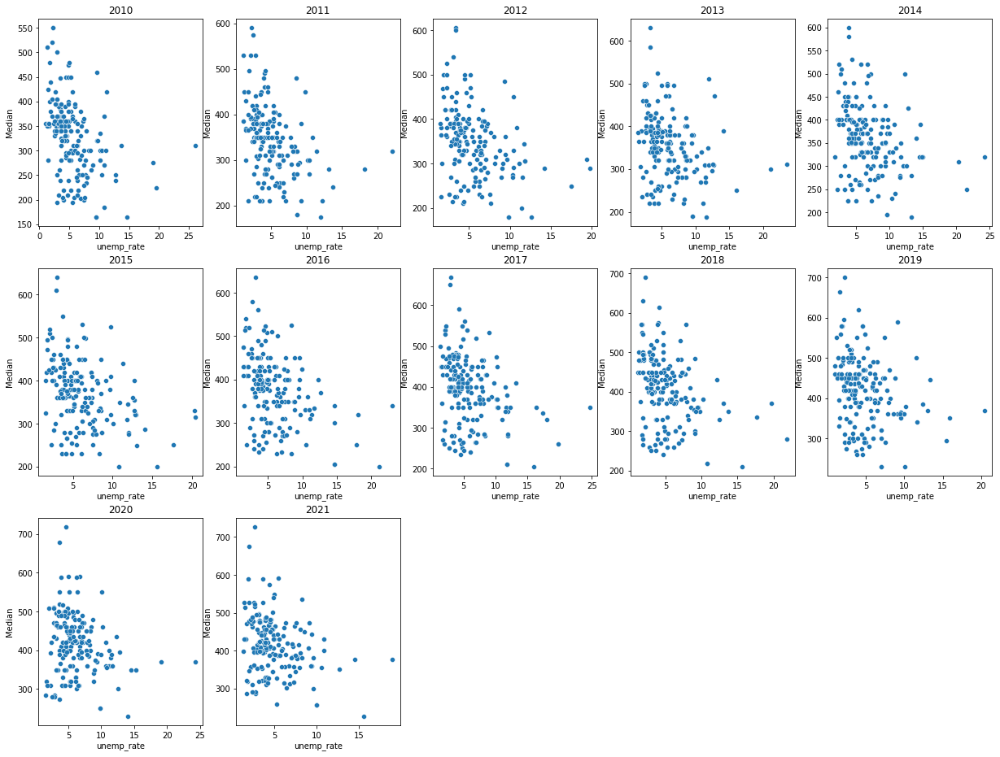

In [140]:
i = 1
plt.figure(figsize=(21,16))

for year in range(2010,2021+1):
    plt.subplot(3,5,i)
    plt.title(f'{year}')
    
    sns.scatterplot(
        data = historical_rental_and_unemp_w_2021_rental[
            historical_rental_and_unemp_w_2021_rental.year == year
        ],
        
        x='unemp_rate',
        y='Median',
    )
    
    i += 1

# Plot: relationship between unemployment rate and median rental price per region

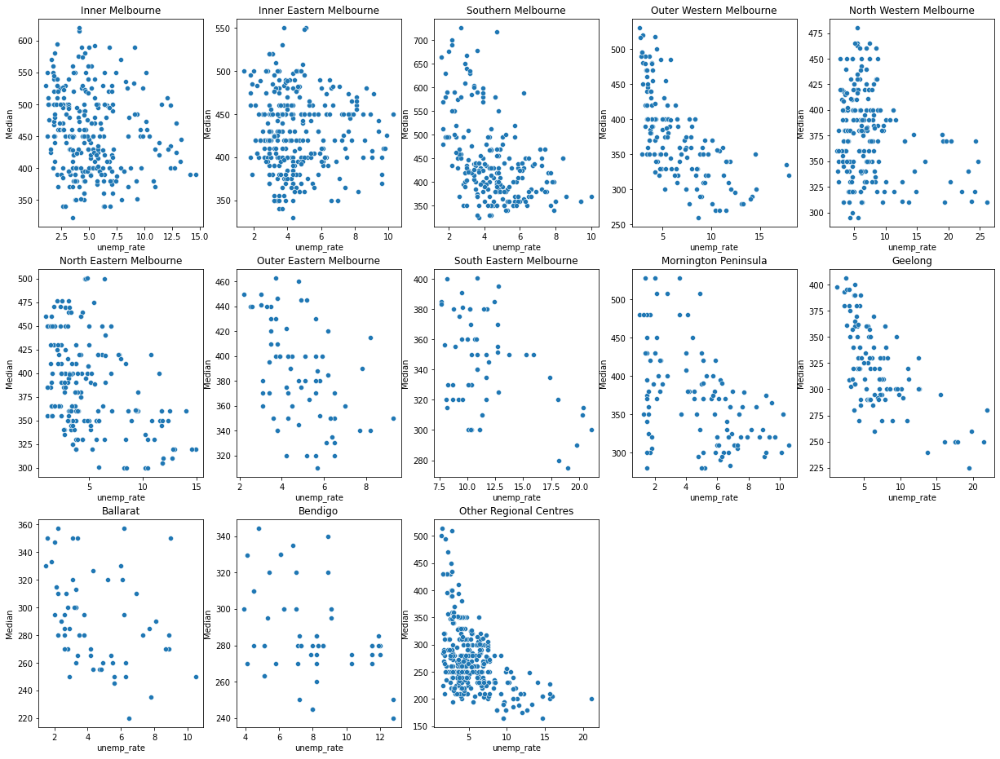

In [141]:
regions = historical_rental_and_unemp_w_2021_rental['Region'].unique()
i = 1
plt.figure(figsize=(21,16))
for region in regions:
    plt.subplot(3,5,i)
    plt.title(f'{region}')
    
    sns.scatterplot(
        data = historical_rental_and_unemp_w_2021_rental[
            historical_rental_and_unemp_w_2021_rental.Region == region
        ],
        
        x='unemp_rate',
        y='Median',
    )
    
    i += 1

# Plot: unemployment rates and rental price overtime by region

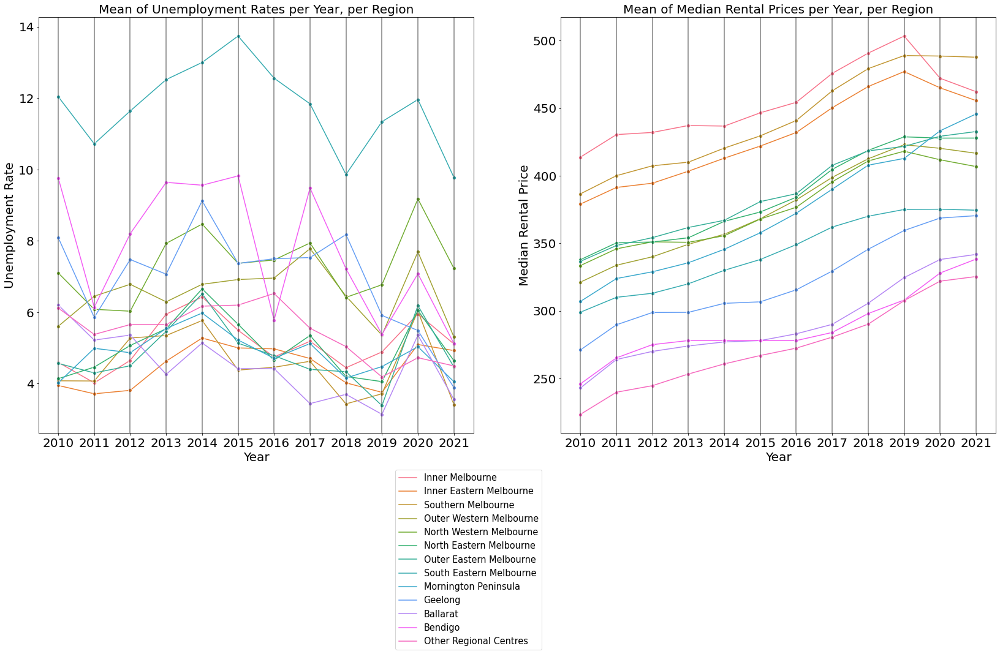

In [338]:
JUMP = 1
FONTSIZE = 20

plt.figure(figsize=(28,12.5))

plt.subplot(1,2,1)


sns.lineplot(data=historical_rental_and_unemp_w_2021_rental,
              x="year",
              y="unemp_rate",
              hue="Region", 
              ci=None,
              marker='o')

#adjusting size of graph for clarity and whatnot 
plt.legend(loc=(0.92-0.1,-0.42-0.1), fontsize=14.5)
plt.xticks(range(2010,2021+1,JUMP), fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.xlabel('Year', fontsize=FONTSIZE)
plt.ylabel('Unemployment Rate', fontsize=FONTSIZE)
plt.title("Mean of Unemployment Rates per Year, per Region",
         fontsize=FONTSIZE)

#add vertical lines in the years to make x-year increase or decrease more 
#for example if x=1 then with the vertical lines we can see ANNUAL decrease
#of the unemployment rate in each region more clearly

for year in range(2010,2021+1,JUMP):
    plt.axvline(x=year,color='black',alpha=0.5)
    


plt.subplot(1,2,2)

sns.lineplot(data=historical_rental_and_unemp_w_2021_rental,
              x="year",
              y="Median",
              hue="Region", 
              ci=None,
              marker='o')

#adjusting size of graph for clarity and whatnot 
plt.legend().remove()
plt.xticks(range(2010,2021+1,JUMP), fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.xlabel('Year', fontsize=FONTSIZE)
plt.ylabel('Median Rental Price', fontsize=FONTSIZE)
plt.title("Mean of Median Rental Prices per Year, per Region",
         fontsize=FONTSIZE)

#add vertical lines in the years to make x-year increase or decrease more 
#for example if x=1 then with the vertical lines we can see ANNUAL decrease
#of the unemployment rate in each region more clearly

for year in range(2010,2021+1,JUMP):
    plt.axvline(x=year,color='black',alpha=0.5)
    
plt.savefig('../plots/Mean_Unemployment_and_Mean_MedianRental_per_year_per_region_subplots.png')

In [337]:
ls ../plots

Top_10_Highest_Population.png          Top_10_Schools_Suburb.png
Top_10_Highest_Population_Density.png  Weekly_Rent_Population_Density_Ring.png
Top_10_Lowest_Population.png           Weekly_Rent_Population_Ring.png
Top_10_Lowest_Population_Density.png


# Plot: mean of unemployment rates and mean of median rental together, per year and per region

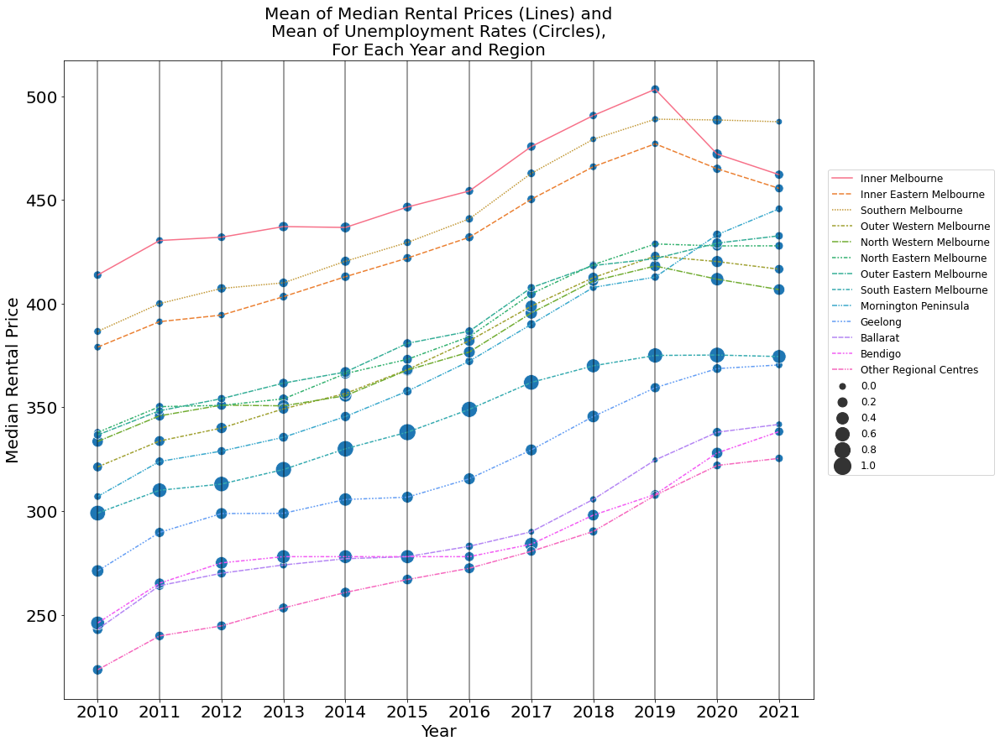

In [365]:
plt.figure(figsize=(16,14))

sns.lineplot(data=historical_rental_and_unemp_w_2021_rental,
              x="year",
              y="Median",
              hue="Region",
              style='Region',
              dashes=True,
              ci=None)


mean_unemp_rate_per_region = historical_rental_and_unemp_w_2021_rental.\
                groupby(['year', 'Region']).\
                agg({'Median':'mean','unemp_rate':'mean'}).\
                reset_index()

#normalize the mean unemployment rates per region into 0-1 range 
mean_unemp_rate_per_region['unemp_rate'] =\
        (mean_unemp_rate_per_region['unemp_rate'] - mean_unemp_rate_per_region['unemp_rate'].min()) /\
        (mean_unemp_rate_per_region['unemp_rate'].max() - mean_unemp_rate_per_region['unemp_rate'].min())   


sns.scatterplot(x = 'year', 
                y = 'Median', 
                size = 'unemp_rate', 
                sizes=(50, 400), #force the size of the markers ()
                data = mean_unemp_rate_per_region)
plt.legend('S')


#adjusting size of graph for clarity and whatnot 

plt.legend(loc=(1.02,0.35),fontsize=12)


plt.xticks(range(2010,2021+1,JUMP), fontsize=FONTSIZE)
plt.yticks(fontsize=FONTSIZE)
plt.xlabel('Year', fontsize=FONTSIZE)
plt.ylabel('Median Rental Price', fontsize=FONTSIZE)
plt.title("Mean of Median Rental Prices (Lines) and\nMean of Unemployment Rates (Circles),\nFor Each Year and Region",
         fontsize=FONTSIZE)

#add vertical lines in the years to make x-year increase or decrease more 
#for example if x=1 then with the vertical lines we can see ANNUAL decrease
#of the unemployment rate in each region more clearly

for year in range(2010,2021+1,JUMP):
    plt.axvline(x=year,color='black',alpha=0.5)
    
    
plt.savefig('../plots/Mean_MedianRental_overlaid_with_Mean_Unemployment_per_year_per_region.png',
           transparent=True)
    

# Suburbs with the *highest* average increase of unemployment rate since 2010

Check that each of the suburb has data from exactly 2010 to 2021

In [153]:
unemp_data_all_suburb_melted.groupby('suburb')['year'].nunique().unique()

array([12])

It turns out that there's *still* duplicates of a combination of suburb, year. 
- i.e. Some suburbs have more than 1 unemployment rate for each year. 
- Best to take the mean of such instances.

In [ ]:
unemp_data_all_suburb_melted_no_sa2_code = unemp_data_all_suburb_melted.drop(columns='sa2_code')

In [207]:
print(unemp_data_all_suburb_melted_no_sa2_code.shape[0]) 
print(unemp_data_all_suburb_melted_no_sa2_code[['suburb','year']].drop_duplicates().shape[0])

5076
4932


In [210]:
unemp_data_all_suburb_melted_no_sa2_code =\
    unemp_data_all_suburb_melted_no_sa2_code.groupby(['suburb','year'])['unemp_rate'].mean().reset_index()

In [307]:
def add_pct_change(df_suburb):
    df_suburb = df_suburb.sort_values(by='year')
    
    # + 1 to show direct percentage comparison compared to 
    # previous year
    df_suburb['pct_change'] = df_suburb['unemp_rate'].pct_change() + 1
    return df_suburb

unemp_data_all_suburb_melted_w_pct_change = unemp_data_all_suburb_melted_no_sa2_code.groupby('suburb').\
        apply(lambda df_suburb: add_pct_change(df_suburb)).dropna()

suburbs_and_unemp_pct_change = unemp_data_all_suburb_melted_w_pct_change.groupby('suburb')['pct_change'].mean().reset_index()

In [361]:
def generate_barplot(data, title):
    
    plt.figure(figsize=(15, 15)) 
    
    fig = sns.barplot(x = 'suburb', 
                      y = 'pct_change', 
                      data = data, 
                      palette = 'mako' ,  
                      dodge=False,
                     )
    
    data['pct_change'] = round(data['pct_change'],4)
    
    e = 0.01
    
    fig.set(ylim=(data['pct_change'].min() - e, 
                  data['pct_change'].max() + e))
    
    #fig.legend(loc='center left', bbox_to_anchor=(1.02, 0.5), ncol=1,  prop={'size': 20})
    

    fig.set_ylabel('Average Year on Year Change (%)', size = 25)
    fig.set_xlabel('Suburb', size = 25)

    fig.set_yticklabels(list(set(data['pct_change'])), size = 20)
    
    fig.set_xticklabels([i for i in data['suburb']], size = 17, rotation = 90)
    
    #fig.yaxis.set_major_formatter(FormatStrFormatter('%.4f'))
    
    fig.set_title(title, size = 33)
    
    
    

In [366]:
map_suburb_to_region_rental

Suburb
armadale          Inner Melbourne
carlton north     Inner Melbourne
east melbourne    Inner Melbourne
st kilda          Inner Melbourne
elwood            Inner Melbourne
                       ...       
parkville         Inner Melbourne
carlton           Inner Melbourne
st kilda west     Inner Melbourne
middle park       Inner Melbourne
albert park       Inner Melbourne
Name: Region, Length: 209, dtype: object

In [369]:
set(unemp_ten_lowest['suburb']) & set(map_suburb_to_region_rental.index)

{'ballarat east', 'belmont', 'geelong', 'geelong west', 'newtown', 'swan hill'}

In [370]:
unemp_ten_lowest = suburbs_and_unemp_pct_change.sort_values(by='pct_change',ascending=True).head(10)
unemp_ten_highest = suburbs_and_unemp_pct_change.sort_values(by='pct_change',ascending=False).head(10)

In [372]:
unemp_ten_lowest

,suburb,pct_change
268,newtown,0.9308
181,irymple,0.9403
148,geelong west,0.9458
161,hamlyn heights,0.9458
354,swan hill,0.9474
24,ballarat east,0.9477
37,belmont,0.9488
32,beaufort,0.9506
209,laverton,0.9521
147,geelong,0.9522


In [ ]:
LGA_unemp_least_ten_mapping = {'newtown':'Golden Plains Shire',
                               'irymple':'Rural City of Mildura',
                               'geelong west':'City of Greater Geelong',
                               'hamlyn heights':'Greater Geelong City Council',
                               'swan hill':'Rural City of Swan Hill',
                               'ballarat east':'City of Ballarat',
                               'belmont':'City of Greater Geelong',
                             }

/tmp/ipykernel_904/1851448644.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  fig.set_yticklabels(list(set(data['pct_change'])), size = 20)


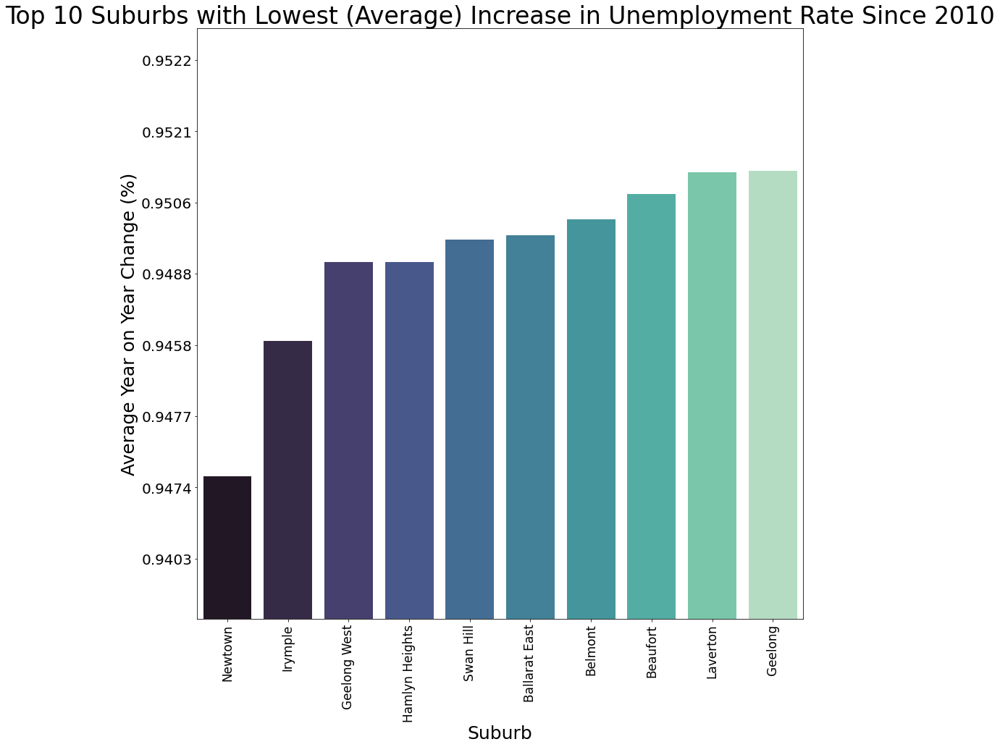

In [384]:
unemp_ten_lowest['suburb'] = unemp_ten_lowest['suburb'].str.title()
generate_barplot(unemp_ten_lowest,
                'Top 10 Suburbs with Lowest (Average) Increase in Unemployment Rate Since 2010')

/tmp/ipykernel_904/1851448644.py:25: UserWarning: FixedFormatter should only be used together with FixedLocator
  fig.set_yticklabels(list(set(data['pct_change'])), size = 20)


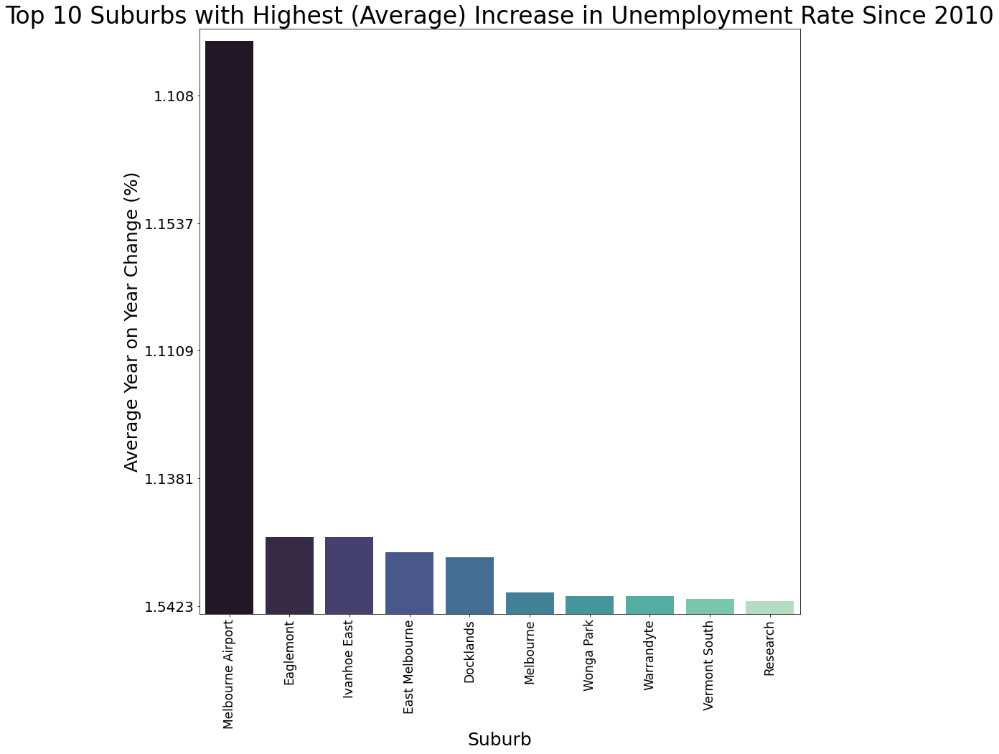

In [385]:
unemp_ten_highest['suburb'] = unemp_ten_highest['suburb'].str.title()
generate_barplot(unemp_ten_highest,
                'Top 10 Suburbs with Highest (Average) Increase in Unemployment Rate Since 2010')

Later can experiment: lineplot unemployment rates, and use markers for rentla prices

In [ ]:
# had an idea of parallel coordinates but won't be too suitable since there are many regions

# hist_rental_and_ump_w_region = historical_rental_and_unemp_w_2021_rental[['unemp_rate', 'Median','Region']].copy()

# #scaling them into 0-1 range to be comparable in PC
# unemp_rate_min = hist_rental_and_ump_w_region['unemp_rate'].min()
# unemp_rate_max = hist_rental_and_ump_w_region['unemp_rate'].max()
# unemp_rate_range = unemp_rate_max - unemp_rate_min

# Median_rent_min = hist_rental_and_ump_w_region['Median'].min()
# Median_rent_max = hist_rental_and_ump_w_region['Median'].max()
# Median_rent_range = Median_rent_max - Median_rent_min


# hist_rental_and_ump_w_region['unemp_rate'] =\
#         (hist_rental_and_ump_w_region['unemp_rate'] - unemp_rate_min)/unemp_rate_range

# hist_rental_and_ump_w_region['Median'] =\
#         (hist_rental_and_ump_w_region['Median'] - Median_rent_min)/Median_rent_range


# hist_rental_and_ump_w_region =\
#     hist_rental_and_ump_w_region.rename(columns={'unemp_rate':'Unemployment Rate',
#                                                  'Median':'Median Rental Price'})


# #plot parallel coordinates
# plt.figure(figsize=(17,10.5))
# plt.xticks(fontsize=15)
# plt.yticks(fontsize=15)

# parallel_coordinates(
#     hist_rental_and_ump_w_region, 
#     'Region',
#     sort_labels=True,
#     alpha=0.5
# )

# plt.legend(loc=(1.06,0.2),fontsize=12)

# Save the preprocessed historical rental file and final preprocessed unemployment melted data!

In [ ]:
rental_data_all_suburb_with_2021.to_csv('../data/curated/Fixed_Weekly_Median_Suburb_Rents.csv')

In [ ]:
unemp_data_all_suburb_melted.to_csv('../data/curated/Final_preprocesed_unemployment_melted.csv')

In [ ]:
unemp_data_all_suburb_melted